
# **Project Topic**: Design of a Processing Architecture for Human Activity Classification Based on Multimodal Data

**Team member:**
- Thibaut LONGCHAMPS
- Emmanuel Jonathan EBONGOM MANYOL

## Data Source Directory Architecture  

<!-- |- 1  

|  ....  

|--25  

    - back  
        - EMG  
        - IMU  
        - IPS  
    - forward  
        - EMG  
        - IMU  
        - IPS  
    - halfsquat  
        - EMG  
        - IMU  
        - IPS  
    - still  
        - EMG  
        - IMU  
        - IPS -->  
Where 1-25 is the index of each participant.  

**Project Goal:** The main objective is to compare a unified architecture (encompassing all modalities) with a multi-modal architecture and evaluate the performance of each model.  

**Data Source:** [MovePort: Multimodal Dataset of EMG, IMU, MoCap, and Insole Pressure for Analyzing Abnormal Movements and Postures in Rehabilitation Training](https://figshare.com/articles/dataset/MovePort_Multimodal_Dataset_of_EMG_IMU_MoCap_and_Insole_Pressure_for_Analyzing_Abnormal_Movements_and_Postures_in_Rehabilitation_Training/25202183?file=46577461)  

**Article Related to the Datasource:** [IEEExplore Article](https://ieeexplore.ieee.org/document/10601196)  

## **1. Data Reading and Formatting**  
- Loading raw data from various sensors.  
- Preparing the data to make it usable by the models, ensuring temporal alignment and synchronization of data from the different modalities.

In [ ]:
# OS and file handling
import os
from glob import glob
import zipfile

# Data manipulation
import pandas as pd
import numpy as np

# HTTP requests
import requests

# Progress bar
from tqdm import tqdm

# Data preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
)

# Machine learning models
from scikeras.wrappers import KerasClassifier

# Deep learning
import keras
from keras import layers
from keras.models import Model
from keras.layers import (
    Dense, Input, concatenate, GlobalAveragePooling1D, Dropout
)
from tensorflow.keras import layers, Input, Model
from tensorflow.keras.optimizers import Adam
import keras_tuner as kt
from keras.utils import plot_model

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image


### Downloading data

⚠️ Uncomment the next cell if you want to download the data 

In [2]:
# # Create the "data" directory if it doesn't exist
# data_dir = 'data'
# os.makedirs(data_dir, exist_ok=True)

# # URL of the data to download
# url = 'https://figshare.com/ndownloader/articles/25202183/versions/1'

# # Path to save the downloaded file
# file_path = os.path.join(data_dir, 'dataset.zip')

# # Check if the file already exists
# if os.path.exists(file_path):
#     print(f'The file already exists at {file_path}. Skipping download.')
# else:
#     # Download the file
#     response = requests.get(url)
#     with open(file_path, 'wb') as f:
#         f.write(response.content)
#     print(f'Data downloaded and saved to {file_path}')

In [3]:
# !pwd

📝 After downloading the data and extracting them, the next step is to prepare and process the multimodal datasets for analysis and modeling. This involves: 

1. **Defining sampling rates**: Assign appropriate sampling frequencies for each modality (e.g., EMG, IMU, IPS, MoCap).  
2. **Ensuring proper feature alignment**: Use predefined feature dictionaries to validate or correct the dataset formatting for each modality.  
3. **Iterating through participant data**: Load data files for each activity and participant, ensuring proper structure and handling any missing or irrelevant data (e.g., skipping certain participant-modality combinations).  
4. **Saving processed data**: Resample each modality's data to the defined rate, align features, and save the processed datasets to CSV files for reuse.  
5. **Loading processed datasets**: Check if the processed files already exist and load them to avoid redundant processing.  
6. **Verifying data alignment**: Print dataset shapes and sample records to ensure proper structure and alignment before further analysis.  

This structured approach facilitates efficient data handling and ensures consistency across modalities.

In [4]:
# Define the data directory
data_dir = 'data'

# Define the sampling rates for each modality
sampling_rates = {
    'emg': 2000,  # Hz
    'imu': 100,   # Hz
    'ips': 60,    # Hz
    'mocap': 100  # Hz 
}

# Dictionary of expected feature names for each modality
features_dict = {
    "emg": [
        "L_Vlat", "L_RF", "L_ST", "L_TA", "L_MG", "L_LG", "L_SOL", "L_IL",
        "R_Vlat", "R_RF", "R_ST", "R_TA", "R_MG", "R_LG", "R_SOL", "R_IL"
    ],
    "imu": [
        "Head_Acc_X", "Head_Acc_Y", "Head_Acc_Z",
        "Head_Gyr_X", "Head_Gyr_Y", "Head_Gyr_Z",
        "Head_Roll", "Head_Pitch", "Head_Yaw",
        "Waist_Acc_X", "Waist_Acc_Y", "Waist_Acc_Z",
        "Waist_Gyr_X", "Waist_Gyr_Y", "Waist_Gyr_Z",
        "Waist_Roll", "Waist_Pitch", "Waist_Yaw",
        "L_H_Acc_X", "L_H_Acc_Y", "L_H_Acc_Z",
        "L_H_Gyr_X", "L_H_Gyr_Y", "L_H_Gyr_Z",
        "L_H_Roll", "L_H_Pitch", "L_H_Yaw",
        "R_H_Acc_X", "R_H_Acc_Y", "R_H_Acc_Z",
        "R_H_Gyr_X", "R_H_Gyr_Y", "R_H_Gyr_Z",
        "R_H_Roll", "R_H_Pitch", "R_H_Yaw",
        "L_F_Acc_X", "L_F_Acc_Y", "L_F_Acc_Z",
        "L_F_Gyr_X", "L_F_Gyr_Y", "L_F_Gyr_Z",
        "L_F_Roll", "L_F_Pitch", "L_F_Yaw",
        "R_F_Acc_X", "R_F_Acc_Y", "R_F_Acc_Z",
        "R_F_Gyr_X", "R_F_Gyr_Y", "R_F_Gyr_Z",
        "R_F_Roll", "R_F_Pitch", "R_F_Yaw"
    ],
    "ips": [
        f'feature_{i+1}' for i in range(682)  # 682 features for IPS
    ],
    "mocap": [
        f"marker_{i+1}_x" for i in range(26)] + \
        [f"marker_{i+1}_y" for i in range(26)] + \
        [f"marker_{i+1}_z" for i in range(26)
    ]
}

def correct_df_formatting(dataset, modality):
    # Transpose the dataset
    dataset = dataset.T
    # Promote the first row as the header
    dataset.columns = dataset.iloc[0]
    dataset = dataset[1:]  # Remove the first row
    dataset.reset_index(drop=True, inplace=True)  # Reset the index
    
    # Drop the first column (which is now unnecessary)
    dataset = dataset.drop(columns=dataset.columns[0])  # Drop the first column
    
    # Check if the first row contains meaningful feature names
    if not all(name in features_dict[modality] for name in dataset.columns):
        dataset.columns = features_dict[modality]  # Use dictionary names if not meaningful
    
    return dataset

# Function to load and process data for a specific modality
def load_modality_data(modality):
    all_data = []
    
    # Iterate through each participant's directory
    person_idx = [i for i in range(1, 26)]
    for participant in person_idx:  
        # Skip participant 19's COP data
        if modality == 'cop' and participant == 19:
            print(f"Skipping COP data for participant 19")
            continue
            
        participant_dir = os.path.join(data_dir, str(participant))
        
        # Iterate through each activity type
        for activity in ['back', 'forward', 'halfsquat', 'still']:
            activity_dir = os.path.join(participant_dir, activity)
            print(f"Checking directory: {activity_dir}")  # Debugging line
            if os.path.exists(activity_dir):
                # Load all CSV files for the current modality
                for file in os.listdir(activity_dir):
                    # Check if the file starts with the modality name followed by an underscore or matches the modality name exactly
                    if (file.startswith(modality + '_') or file == modality + '.csv') and file.endswith('.csv'):
                        print(f"Found file: {file}")  # Debugging line
                        file_path = os.path.join(activity_dir, file)
                        
                        try:
                            df = pd.read_csv(file_path, header=None)  # Load without a header
                            # Validate the number and names of columns
                            expected_features = features_dict[modality]

                            # Correct the DataFrame formatting
                            df = correct_df_formatting(df, modality)
                            
                            # Add participant and activity columns
                            df['participant'] = participant
                            df['activity'] = activity
                            
                            # Append the DataFrame to the list
                            all_data.append(df)
                            
                        except Exception as e:
                            print(f"Error processing file {file} for participant {participant}: {str(e)}")
                            continue
                            
            else:
                print(f"Directory does not exist: {activity_dir}")  # Debugging line
    
    # Check if any data was collected
    if not all_data:
        print(f"No data found for modality: {modality}")  # Debugging line
        return pd.DataFrame()  # Return an empty DataFrame if no data was found
    
    # Concatenate all DataFrames into a single DataFrame
    combined_data = pd.concat(all_data, axis=0, ignore_index=True)
    
    # Resample the data to the target sampling rate
    target_rate = sampling_rates.get(modality, None)
    
    # Resampling logic (assuming time column exists)
    if 'time' in combined_data.columns:
        combined_data.set_index('time', inplace=True)
        combined_data = combined_data.resample(f'{1/target_rate}S').mean().interpolate()  # Resample and interpolate
        combined_data.reset_index(inplace=True)
    
    return combined_data

# Load data for each modality and Save the processed datasets to CSV files if they contain data
data_processed_dir = 'data_processed'
os.makedirs(data_processed_dir, exist_ok=True)

# Define paths for all modalities
emg_path = f'{data_processed_dir}/emg.csv'
imu_path = f'{data_processed_dir}/imu.csv'
ips_path = f'{data_processed_dir}/ips.csv'
mocap_path = f'{data_processed_dir}/mocap.csv'

# Check if all files exist
all_files_exist = all(os.path.exists(path) for path in [emg_path, imu_path, ips_path, mocap_path])

if not all_files_exist:
    # Load each modality
    emg_data = load_modality_data('emg')
    imu_data = load_modality_data('imu')
    ips_data = load_modality_data('ips')
    mocap_data = load_modality_data('mocap')
    
    # Save non-empty datasets
    if not emg_data.empty:
        emg_data.to_csv(emg_path, index=False)
    if not imu_data.empty:
        imu_data.to_csv(imu_path, index=False)
    if not ips_data.empty:
        ips_data.to_csv(ips_path, index=False)
    if not mocap_data.empty:
        mocap_data.to_csv(mocap_path, index=False)
        
    print("📍 Data processing complete. All datasets saved to CSV files.")
else: 
    # Load all datasets from CSV
    emg_data = pd.read_csv(emg_path)
    imu_data = pd.read_csv(imu_path)
    ips_data = pd.read_csv(ips_path)
    mocap_data = pd.read_csv(mocap_path)
    print("Data successfully loaded from CSV files.")

# Print shapes to verify alignment
print("📍 Dataset shapes before processing:")
print(f"EMG: {emg_data.shape}")
print(f"IMU: {imu_data.shape}")
print(f"IPS: {ips_data.shape}")
print(f"MoCap: {mocap_data.shape}")

# Verify some samples from each modality
def verify_samples(datasets, n_samples=5):
    """Print first n samples of participant and activity columns for each dataset"""
    modalities = ['EMG', 'IMU', 'IPS', 'MoCap']
    for modality, data in zip(modalities, datasets):
        print(f"\n{modality} first {n_samples} samples:")
        if not data.shape == (0,0): 
            print(data[['participant', 'activity']].head(n_samples))
        else:
            print(f"⚠️ {modality} dataset is empty!")

verify_samples([emg_data, imu_data, ips_data, mocap_data])

Data successfully loaded from CSV files.
📍 Dataset shapes before processing:
EMG: (11348420, 18)
IMU: (567439, 56)
IPS: (352872, 684)
MoCap: (567439, 80)

EMG first 5 samples:
   participant activity
0            1     back
1            1     back
2            1     back
3            1     back
4            1     back

IMU first 5 samples:
   participant activity
0            1     back
1            1     back
2            1     back
3            1     back
4            1     back

IPS first 5 samples:
   participant activity
0            1     back
1            1     back
2            1     back
3            1     back
4            1     back

MoCap first 5 samples:
   participant activity
0            1     back
1            1     back
2            1     back
3            1     back
4            1     back


📝 Comment: 

This script automates the loading, formatting, processing, and validation of multimodal time-series data for a study. Here's what it does step-by-step:

1. **Configuration and Setup**:
   - Defines paths for raw data (`data`) and processed data (`data_processed`).
   - Specifies sampling rates for four modalities: EMG, IMU, IPS, and MoCap.
   - Lists expected feature names for each modality in a dictionary (`features_dict`).

2. **Data Formatting and Validation**:
   - The `correct_df_formatting` function ensures that the dataset's columns match the expected format:
     - Transposes the dataset if necessary.
     - Sets feature names from the predefined dictionary if the loaded data doesn't already contain valid names.

3. **Data Loading**:
   - The `load_modality_data` function iterates through participants and activities:
     - Skips participant 19 for a specific modality (COP).
     - Loads CSV files for the specified modality and validates their formatting.
     - Adds metadata columns (`participant`, `activity`) to each DataFrame.
   - Data is resampled to the target sampling rate, if applicable, and concatenated across participants and activities.

4. **Saving Processed Data**:
   - Processes data for each modality and saves non-empty datasets to CSV files in the `data_processed` directory.

5. **Data Reloading**:
   - If all processed data files already exist, it loads them directly from disk, bypassing reprocessing.

6. **Data Verification**:
   - Prints shapes of datasets to confirm alignment.
   - Displays the first few samples of `participant` and `activity` columns for each modality to verify integrity.

## Alining datasets to be at the same sample count

In [5]:

def process_multimodal_data(emg_df: pd.DataFrame, imu_df: pd.DataFrame, ips_df: pd.DataFrame, 
                             mocap_df: pd.DataFrame, sampling_rates: dict) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Process multimodal sensor data by grouping by participant and activity, then applying
    resampling and averaging.
    
    Args:
        emg_df (pd.DataFrame): EMG sensor data
        imu_df (pd.DataFrame): IMU sensor data
        ips_df (pd.DataFrame): IPS sensor data
        mocap_df (pd.DataFrame): MoCap sensor data
        sampling_rates (dict): Dictionary containing sampling rates for each modality
    
    Returns:
        tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]: 
            Processed EMG, IMU, IPS, and MoCap dataframes with aligned samples and timestamps
    """
    processed_emg = []
    processed_imu = []
    processed_ips = []
    processed_mocap = []
    
    # Get unique participants and activities
    participants = emg_df['participant'].unique()
    activities = emg_df['activity'].unique()
    
    # Convert sampling rates to nanoseconds
    sampling_periods_ns = {
        modality: int(1e9 / rate) for modality, rate in sampling_rates.items()
    }
    
    for participant in participants:
        for activity in activities:
            # Get data for current participant and activity for each modality
            emg_group = emg_df[(emg_df['participant'] == participant) & 
                              (emg_df['activity'] == activity)]
            imu_group = imu_df[(imu_df['participant'] == participant) & 
                              (imu_df['activity'] == activity)]
            ips_group = ips_df[(ips_df['participant'] == participant) & 
                              (ips_df['activity'] == activity)]
            mocap_group = mocap_df[(mocap_df['participant'] == participant) & 
                                   (mocap_df['activity'] == activity)]
            
            if len(emg_group) == 0 or len(imu_group) == 0 or len(ips_group) == 0:
                continue
            
            # Convert data types to numeric, if necessary
            emg_group = emg_group.apply(pd.to_numeric, errors='coerce')
            imu_group = imu_group.apply(pd.to_numeric, errors='coerce')
            ips_group = ips_group.apply(pd.to_numeric, errors='coerce')
            mocap_group = mocap_group.apply(pd.to_numeric, errors='coerce')
            
            # Create time indices for each modality using nanoseconds
            emg_time = pd.date_range(
                start='2024-01-01',
                periods=len(emg_group),
                freq=f'{sampling_periods_ns["emg"]}ns'
            )
            imu_time = pd.date_range(
                start='2024-01-01',
                periods=len(imu_group),
                freq=f'{sampling_periods_ns["imu"]}ns'
            )
            ips_time = pd.date_range(
                start='2024-01-01',
                periods=len(ips_group),
                freq=f'{sampling_periods_ns["ips"]}ns'
            )
            mocap_time = pd.date_range(
                start='2024-01-01',
                periods=len(mocap_group),
                freq=f'{sampling_periods_ns["mocap"]}ns'
            )
            
            # Create temporary dataframes with time indices and preserved column names
            emg_temp = pd.DataFrame(
                emg_group.drop(['participant', 'activity'], axis=1).values,
                index=emg_time,
                columns=[col for col in emg_group.columns if col not in ['participant', 'activity']]
            )
            imu_temp = pd.DataFrame(
                imu_group.drop(['participant', 'activity'], axis=1).values,
                index=imu_time,
                columns=[col for col in imu_group.columns if col not in ['participant', 'activity']]
            )
            ips_temp = pd.DataFrame(
                ips_group.drop(['participant', 'activity'], axis=1).values,
                index=ips_time,
                columns=[col for col in ips_group.columns if col not in ['participant', 'activity']]
            )
            mocap_temp = pd.DataFrame(
                mocap_group.drop(['participant', 'activity'], axis=1).values,
                index=mocap_time,
                columns=[col for col in mocap_group.columns if col not in ['participant', 'activity']]
            )
            
            # Resample all modalities to 50ms
            emg_resampled = emg_temp.resample('50ms').mean().interpolate()
            imu_resampled = imu_temp.resample('50ms').mean().interpolate()
            ips_resampled = ips_temp.resample('50ms').mean().interpolate()
            mocap_resampled = mocap_temp.resample('50ms').mean().interpolate()
            
            # Find common time range
            start_time = max(emg_resampled.index[0], imu_resampled.index[0], ips_resampled.index[0], mocap_resampled.index[0])
            end_time = min(emg_resampled.index[-1], imu_resampled.index[-1], ips_resampled.index[-1], mocap_resampled.index[-1])
            
            # Trim to common time range
            emg_resampled = emg_resampled[start_time:end_time]
            imu_resampled = imu_resampled[start_time:end_time]
            ips_resampled = ips_resampled[start_time:end_time]
            mocap_resampled = mocap_resampled[start_time:end_time]
            
            # Add timestamp and metadata
            for df in [emg_resampled, imu_resampled, ips_resampled, mocap_resampled]:
                df['timestamp'] = (df.index - df.index[0]).total_seconds()
                df['participant'] = participant
                df['activity'] = activity
                
            # Append to respective lists
            processed_emg.append(emg_resampled)
            processed_imu.append(imu_resampled)
            processed_ips.append(ips_resampled)
            processed_mocap.append(mocap_resampled)
    
    # Concatenate results
    final_emg = pd.concat(processed_emg, ignore_index=True)
    final_imu = pd.concat(processed_imu, ignore_index=True)
    final_ips = pd.concat(processed_ips, ignore_index=True)
    final_mocap = pd.concat(processed_mocap, ignore_index=True)
    
    return final_emg, final_imu, final_ips, final_mocap

# Define sampling rates
sampling_rates = {
    'emg': 2000,  # Hz
    'imu': 100,   # Hz
    'ips': 60,    # Hz
    'mocap': 100  # Hz 
}

# Process the data
processed_emg, processed_imu, processed_ips, processed_mocap = process_multimodal_data(
    emg_data, imu_data, ips_data, mocap_data, sampling_rates
)

# Print shapes to verify alignment
print("Dataset shapes after processing:")
print(f"EMG: {processed_emg.shape}")
print(f"IMU: {processed_imu.shape}")
print(f"IPS: {processed_ips.shape}")
print(f"MoCap: {processed_mocap.shape}")

# Verify timestamp alignment
print("\nVerifying timestamp alignment for first few samples:")
print(f"EMG timestamps: {processed_emg['timestamp'].iloc[:5].tolist()}")
print(f"IMU timestamps: {processed_imu['timestamp'].iloc[:5].tolist()}")
print(f"IPS timestamps: {processed_ips['timestamp'].iloc[:5].tolist()}")
print(f"MoCap timestamps: {processed_mocap['timestamp'].iloc[:5].tolist()}")

# Verify column names are preserved
print("\nColumn names in processed datasets:")
print("EMG columns:", processed_emg.columns.tolist())
print("IMU columns:", processed_imu.columns.tolist())
print("IPS columns:", processed_ips.columns.tolist())
print("MoCap columns:", processed_mocap.columns.tolist())

# Save processed data
data_processed_dir = 'data_processed'
os.makedirs(data_processed_dir, exist_ok=True)

processed_emg.to_csv(f'{data_processed_dir}/processed_emg.csv', index=False)
processed_imu.to_csv(f'{data_processed_dir}/processed_imu.csv', index=False)
processed_ips.to_csv(f'{data_processed_dir}/processed_ips.csv', index=False)
processed_mocap.to_csv(f'{data_processed_dir}/processed_mocap.csv', index=False)

Dataset shapes after processing:
EMG: (113477, 19)
IMU: (113477, 57)
IPS: (113477, 685)
MoCap: (113477, 81)

Verifying timestamp alignment for first few samples:
EMG timestamps: [0.0, 0.05, 0.1, 0.15, 0.2]
IMU timestamps: [0.0, 0.05, 0.1, 0.15, 0.2]
IPS timestamps: [0.0, 0.05, 0.1, 0.15, 0.2]
MoCap timestamps: [0.0, 0.05, 0.1, 0.15, 0.2]

Column names in processed datasets:
EMG columns: ['R_Vlat', 'R_RF', 'R_ST', 'R_TA', 'L_Vlat', 'L_RF', 'L_ST', 'L_TA', 'R_MG', 'R_LG', 'R_SOL', 'R_IL', 'L_MG', 'L_LG', 'L_SOL', 'L_IL', 'timestamp', 'participant', 'activity']
IMU columns: ['Head_Acc_X', 'Head_Acc_Y', 'Head_Acc_Z', 'Head_Gyr_X', 'Head_Gyr_Y', 'Head_Gyr_Z', 'Head_Roll', 'Head_Pitch', 'Head_Yaw', 'Waist_Acc_X', 'Waist_Acc_Y', 'Waist_Acc_Z', 'Waist_Gyr_X', 'Waist_Gyr_Y', 'Waist_Gyr_Z', 'Waist_Roll', 'Waist_Pitch', 'Waist_Yaw', 'L_H_Acc_X', 'L_H_Acc_Y', 'L_H_Acc_Z', 'L_H_Gyr_X', 'L_H_Gyr_Y', 'L_H_Gyr_Z', 'L_H_Roll', 'L_H_Pitch', 'L_H_Yaw', 'R_H_Acc_X', 'R_H_Acc_Y', 'R_H_Acc_Z', 'R_H_Gyr_X', 

📝 Comment: 

The previous cell's script aims at preprocessing the modalities' datasets. It is highly flexible, handling variations in sampling rates and missing data groups seamlessly. It ensures precise temporal alignment across modalities, a critical aspect of multimodal analysis, and its iterative processing design enables easy scalability to accommodate additional participants or activities.

In [6]:
processed_emg.head()

,R_Vlat,R_RF,R_ST,R_TA,L_Vlat,L_RF,L_ST,L_TA,R_MG,R_LG,R_SOL,R_IL,L_MG,L_LG,L_SOL,L_IL,timestamp,participant,activity
0,-0.413109,-1.091675,-2.695953,-5.241852,-0.842926,-1.576080,-3.417023,-3.230713,-1.127398,-4.794994,3.348541,-0.560944,0.536963,0.927521,-1.725145,-0.037262,0.00,1,back
1,-1.840337,-0.411662,-2.808746,-2.442926,-0.879181,-1.422688,-1.878204,-3.791474,-2.579866,-0.899323,0.692871,-1.679583,-0.646545,11.239014,1.106781,-0.707977,0.05,1,back
2,-2.317291,-2.054966,-2.145081,-5.682953,-0.962823,-2.791626,-2.929596,-2.052429,-1.382721,-1.865112,-12.866455,-2.031317,1.276978,-1.898346,-0.763367,0.973846,0.10,1,back
3,-1.544861,-2.074585,-3.937132,-3.639583,-0.975598,-1.134618,-2.515889,-2.820831,-4.346207,1.396820,-0.211487,-1.692979,-2.336426,12.115173,-1.222681,0.501526,0.15,1,back
4,-1.801843,-1.312225,-4.104579,-1.337402,-1.386749,-2.937727,0.237671,-2.818589,-2.068542,0.713013,7.895508,-3.906464,1.404877,4.615974,-1.796860,2.453434,0.20,1,back


In [7]:
sum(processed_imu['timestamp'] == processed_emg['timestamp'])

113477

In [8]:
## Checking that all dataset have been alined correctly
sum(processed_imu['timestamp'] == processed_ips['timestamp']) == sum(processed_imu['timestamp'] == processed_emg['timestamp'])

True

In [9]:
processed_emg[['participant','activity']].value_counts()

participant  activity 
19           still        1694
24           forward      1674
11           still        1575
6            forward      1541
24           back         1447
                          ... 
8            forward       701
3            still         436
20           still         307
15           still         290
13           halfsquat     135
Name: count, Length: 92, dtype: int64

In [10]:
# Creating a label dataset
activity_label = processed_emg['activity']

# Dropping the 'activity' and 'participant' features from the datasets that will be used for data modeling
emg_cnn = processed_emg.drop(columns=['activity', 'participant', 'timestamp'], axis=1)
imu_cnn = processed_imu.drop(columns=['activity', 'participant', 'timestamp'], axis=1)
ips_cnn = processed_ips.drop(columns=['activity', 'participant', 'timestamp'], axis=1)
mocap_cnn = processed_mocap.drop(columns=['activity', 'participant', 'timestamp'], axis=1) if not processed_mocap.empty else pd.DataFrame()

# Adding a position id to all data frames
emg_cnn.insert(0, 'id', range(len(processed_emg)))
imu_cnn.insert(0, 'id', range(len(processed_imu)))
ips_cnn.insert(0, 'id', range(len(processed_ips)))
if not processed_mocap.empty:
    mocap_cnn.insert(0, 'id', range(len(processed_mocap)))

# For activity_label, if it's a Series, convert to DataFrame first
if isinstance(activity_label, pd.Series):
    activity_label = activity_label.to_frame()
activity_label.insert(0, 'id', range(len(activity_label)))

# Verify the column order
print("\nVerifying 'id' column position:")
print("EMG first columns:", emg_cnn.columns[:3].tolist())
print("IMU first columns:", imu_cnn.columns[:3].tolist())
print("IPS first columns:", ips_cnn.columns[:3].tolist())
if not processed_mocap.empty:
    print("MoCap first columns:", mocap_cnn.columns[:3].tolist())
print("Activity label columns:", activity_label.columns.tolist())

# Saving the label dataset
activity_label.to_csv(f'{data_processed_dir}/activity_label.csv', index=False)

# Optionally save the CNN datasets for EMG, IMU, IPS, and MoCap
emg_cnn.to_csv(f'{data_processed_dir}/emg_cnn.csv', index=False)
imu_cnn.to_csv(f'{data_processed_dir}/imu_cnn.csv', index=False)
ips_cnn.to_csv(f'{data_processed_dir}/ips_cnn.csv', index=False)
if not processed_mocap.empty:
    mocap_cnn.to_csv(f'{data_processed_dir}/mocap_cnn.csv', index=False)


Verifying 'id' column position:
EMG first columns: ['id', 'R_Vlat', 'R_RF']
IMU first columns: ['id', 'Head_Acc_X', 'Head_Acc_Y']
IPS first columns: ['id', 'feature_1', 'feature_2']
MoCap first columns: ['id', 'marker_1_x', 'marker_2_x']
Activity label columns: ['id', 'activity']


In [11]:
# Print the shapes of the DataFrames
print("Shape of EMG CNN DataFrame:", emg_cnn.shape)
print("Shape of IMU CNN DataFrame:", imu_cnn.shape)
print("Shape of IPS CNN DataFrame:", ips_cnn.shape)

if not processed_mocap.empty:
    print("Shape of MoCap CNN DataFrame:", mocap_cnn.shape)
else:
    print("MoCap CNN DataFrame is empty.")

Shape of EMG CNN DataFrame: (113477, 17)
Shape of IMU CNN DataFrame: (113477, 55)
Shape of IPS CNN DataFrame: (113477, 683)
Shape of MoCap CNN DataFrame: (113477, 79)


In [12]:
activity_label.columns

Index(['id', 'activity'], dtype='object')

## **II. Data modeling**

📝 In this section, we are going to proceed with data modeling. This section will encompass the development of helper function for model training and data preparation for data modeling. 

In [13]:
# Create a small subset of the data for testing
def create_small_dataset(processed_emg, processed_imu, processed_ips, processed_mocap, 
                          n_participants=5, n_samples_per_participant=1000):
    """
    Create a small subset of the data for testing purposes.
    
    Args:
        processed_emg, processed_imu, processed_ips, processed_mocap: Original processed dataframes
        n_participants: Number of participants to include
        n_samples_per_participant: Number of samples per participant
    
    Returns:
        small_emg, small_imu, small_ips, small_mocap: Smaller versions of the processed dataframes
    """
    # Get n_participants unique participants
    participants = processed_emg['participant'].unique()[:n_participants]
    
    # Initialize empty dataframes
    small_emg = pd.DataFrame()
    small_imu = pd.DataFrame()
    small_ips = pd.DataFrame()
    small_mocap = pd.DataFrame() if not processed_mocap.empty else pd.DataFrame()
    
    # For each participant, get n_samples_per_participant samples
    for participant in participants:
        # Get participant data
        emg_participant = processed_emg[processed_emg['participant'] == participant].head(n_samples_per_participant)
        imu_participant = processed_imu[processed_imu['participant'] == participant].head(n_samples_per_participant)
        ips_participant = processed_ips[processed_ips['participant'] == participant].head(n_samples_per_participant)
        
        # Append to small datasets
        small_emg = pd.concat([small_emg, emg_participant])
        small_imu = pd.concat([small_imu, imu_participant])
        small_ips = pd.concat([small_ips, ips_participant])
        
        # Append MoCap data if it exists
        if not processed_mocap.empty:
            mocap_participant = processed_mocap[processed_mocap['participant'] == participant].head(n_samples_per_participant)
            small_mocap = pd.concat([small_mocap, mocap_participant])
    
    # Reset indices
    small_emg = small_emg.reset_index(drop=True)
    small_imu = small_imu.reset_index(drop=True)
    small_ips = small_ips.reset_index(drop=True)
    small_mocap = small_mocap.reset_index(drop=True) if not processed_mocap.empty else pd.DataFrame()
    
    print("Small dataset shapes:")
    print(f"EMG: {small_emg.shape}")
    print(f"IMU: {small_imu.shape}")
    print(f"IPS: {small_ips.shape}")
    print(f"MoCap: {small_mocap.shape if not processed_mocap.empty else 'No MoCap data'}")
    
    return small_emg, small_imu, small_ips, small_mocap

# Create small datasets
small_emg, small_imu, small_ips, small_mocap = create_small_dataset(
    processed_emg, 
    processed_imu, 
    processed_ips,
    processed_mocap,
    n_participants=18,  # Using only 5 participants
    n_samples_per_participant=1500  # Using 100 samples per participant
)

# Creating a small label dataset
small_activity_label = small_emg['activity']
# For activity_label, if it's a Series, convert to DataFrame first
if isinstance(small_activity_label, pd.Series):
    small_activity_label = small_activity_label.to_frame()
small_activity_label.insert(0, 'id', range(len(small_activity_label)))

# Drop the 'activity', 'participant', and 'timestamp' columns from small datasets
small_emg = small_emg.drop(columns=['activity', 'participant', 'timestamp'], axis=1)
small_imu = small_imu.drop(columns=['activity', 'participant', 'timestamp'], axis=1)
small_ips = small_ips.drop(columns=['activity', 'participant', 'timestamp'], axis=1)
if not small_mocap.empty:
    small_mocap = small_mocap.drop(columns=['activity', 'participant', 'timestamp'], axis=1)

# Adding a position id to all data frames
small_emg.insert(0, 'id', range(len(small_emg)))
small_imu.insert(0, 'id', range(len(small_imu)))
small_ips.insert(0, 'id', range(len(small_ips)))
if not small_mocap.empty:
    small_mocap.insert(0, 'id', range(len(small_mocap)))

# Save small datasets
small_emg.to_csv('data_processed/small_emg.csv', index=False)
small_imu.to_csv('data_processed/small_imu.csv', index=False)
small_ips.to_csv('data_processed/small_ips.csv', index=False)
if not small_mocap.empty:
    small_mocap.to_csv('data_processed/small_mocap.csv', index=False)


Small dataset shapes:
EMG: (27000, 19)
IMU: (27000, 57)
IPS: (27000, 685)
MoCap: (27000, 81)


📝 Comment:
Due to some kernel break when working on a huge samples count on our computers, we developped this function to help us continue working on a more small dataset for esch modality.

In [14]:
from tqdm import tqdm

def load_data(df_ips: pd.DataFrame, df_emg: pd.DataFrame, df_imu: pd.DataFrame, 
              df_mocap: pd.DataFrame, activity_label):

    """
    Loads Dataframes IPS, EMG, IMU, MoCap and unified labels into lists and converts them into arrays.
    
    Args:
        df_ips : DataFrame containing IPS data.
        df_emg : DataFrame containing EMG data.
        df_imu : DataFrame containing IMU data.
        df_mocap : DataFrame containing MoCap data.
        activity_label : DataFrame containing the unified labels with corresponding IDs.
    
    Returns:
        X : List of arrays for each modality (IPS, EMG, IMU, MoCap).
        y : List of activity labels.
    """
    X0 = []  # IPS data
    X1 = []  # EMG data
    X2 = []  # IMU data
    X3 = []  # MoCap data
    y = []

    # Iterate through each row in the unified labels df
    for idx, row in tqdm(activity_label.iterrows()):
        y.append(row.activity)
        
        # Extract the corresponding IPS, EMG, IMU, and MoCap data for the current ID and convert to array
        X0.append(df_ips[df_ips['id'] == row['id']].iloc[:, 1:].values)
        X1.append(df_emg[df_emg['id'] == row['id']].iloc[:, 1:].values)
        X2.append(df_imu[df_imu['id'] == row['id']].iloc[:, 1:].values)
        
        if not df_mocap.empty:
            X3.append(df_mocap[df_mocap['id'] == row['id']].iloc[:, 1:].values)
        else:
            X3.append(np.array([]))  # Append empty array if MoCap data is not available

    # Combine all modalities
    X = [X0, X1, X2, X3]
    
    return X, y

In [15]:
# # Instanciate load data function
# # X, y = load_data(df_ips=ips_cnn, df_emg=emg_cnn, df_imu=imu_cnn, activity_label=activity_label)

# X, y = load_data(df_ips=small_ips, df_emg=small_emg, df_imu=small_imu, activity_label=small_activity_label)

# # Assuming small_cop and small_mocap are defined and contain the small datasets for COP and MoCap
# X, y = load_data(
#     df_ips=small_ips, 
#     df_emg=small_emg, 
#     df_imu=small_imu, 
#     df_cop=small_cop, 
#     df_mocap=small_mocap, 
#     activity_label=small_activity_label)

# # # Saving
# # data_training_dir = 'data_training'
# # os.makedirs(data_training_dir, exist_ok=True)
# # np.save(f'{data_training_dir}/X.npy', np.array(X, dtype=object))
# # np.save(f'{data_training_dir}/y.npy', np.array(y, dtype=object))

# # Loading
# # loaded_list = np.load(f'{data_training_dir}/X.npy', allow_pickle=True)

In [16]:
# Check activity alignment for all modalities
imu_ips_alignment = sum(processed_imu['activity'] == processed_ips['activity'])
imu_emg_alignment = sum(processed_imu['activity'] == processed_emg['activity'])
imu_mocap_alignment = sum(processed_imu['activity'] == processed_mocap['activity']) if not processed_mocap.empty else 0

# Print the results
print(f"IMU and IPS activity alignment: {imu_ips_alignment}")
print(f"IMU and EMG activity alignment: {imu_emg_alignment}")
print(f"IMU and MoCap activity alignment: {imu_mocap_alignment}")

# Check if all alignments are equal
all_alignments_equal = (imu_ips_alignment == imu_emg_alignment) and (imu_ips_alignment == imu_mocap_alignment)
print(f"All activity alignments equal: {all_alignments_equal}")

IMU and IPS activity alignment: 113477
IMU and EMG activity alignment: 113477
IMU and MoCap activity alignment: 113477
All activity alignments equal: True


In [17]:
# Instantiate load data function

# using the small dataset for the latter work
X, y = load_data(
    df_ips=ips_cnn, 
    df_emg=emg_cnn, 
    df_imu=imu_cnn, 
    df_mocap=mocap_cnn, 
    activity_label=activity_label
)
## using the full dataset for the latter work
# X, y = load_data(
#     df_ips=ips_cnn, 
#     df_emg=emg_cnn, 
#     df_imu=imu_cnn, 
#     df_mocap=mocap_cnn, 
#     activity_label=activity_label
# )

# # Saving
# data_training_dir = 'data_training'
# os.makedirs(data_training_dir, exist_ok=True)
# np.save(f'{data_training_dir}/X.npy', np.array(X, dtype=object))
# np.save(f'{data_training_dir}/y.npy', np.array(y, dtype=object))

# Loading
# loaded_list = np.load(f'{data_training_dir}/X.npy', allow_pickle=True)

113477it [04:07, 457.99it/s]


In [18]:
for i, modality in enumerate(X):
    sizes = [len(sub_elem) for sub_elem in modality]
    if len(set(sizes)) > 1:
        print(f"Modalité {i} a des sous-éléments de tailles différentes : {set(sizes)}")
    else:
        print(f"Modalité {i}: Tous les sous-éléments ont la même taille ({sizes[0]})")

Modalité 0: Tous les sous-éléments ont la même taille (1)
Modalité 1: Tous les sous-éléments ont la même taille (1)
Modalité 2: Tous les sous-éléments ont la même taille (1)
Modalité 3: Tous les sous-éléments ont la même taille (1)


In [19]:
X[0]

[array([[ 0.    ,  0.    ,  0.    ,  0.    ,  0.    ,  0.    ,  0.    ,
          1.57  ,  0.    ,  0.    ,  0.    ,  0.    ,  0.    ,  0.    ,
          0.    ,  2.73  ,  1.68  ,  2.02  ,  0.    ,  2.18  ,  4.28  ,
          0.    ,  0.    ,  0.    ,  0.    ,  2.01  ,  0.    ,  0.    ,
          1.09  ,  0.    ,  3.32  ,  6.61  ,  0.    ,  0.    ,  0.    ,
          2.42  ,  0.    ,  0.    ,  0.    ,  0.    ,  0.515 ,  3.76  ,
          9.43  ,  2.92  ,  0.    ,  0.    ,  0.    ,  0.    ,  0.    ,
          0.    ,  0.    ,  0.    ,  2.71  ,  9.8075,  2.51  ,  0.    ,
          1.73  ,  0.75  ,  1.61  ,  2.99  ,  3.5   ,  2.39  ,  1.29  ,
          2.51  ,  4.85  ,  0.    ,  0.    ,  2.03  ,  3.    ,  3.76  ,
          4.92  ,  5.28  ,  4.67  ,  4.25  ,  3.8675,  4.64  ,  0.    ,
          0.    ,  2.58  ,  3.6   ,  4.96  ,  5.87  ,  6.3   ,  6.41  ,
          6.84  ,  8.33  ,  6.82  ,  0.    ,  2.88  ,  2.74  ,  3.57  ,
          4.45  ,  5.67  ,  6.82  ,  6.68  , 10.28  , 13.6   , 1

In [20]:
unique_classes = np.unique(y)
print("Unique classes in y_train:", unique_classes)

Unique classes in y_train: ['back' 'forward' 'halfsquat' 'still']


In [21]:
# Check shapes after load data
print("Nombre total d'entrées :")
print(f"Modalité 1 (X0) : {len(X[0])}, Modalité 2 (X1) : {len(X[1])}, Modalité 3 (X2) : {len(X[2])}")
print(f"Labels (y) : {len(y)}")

Nombre total d'entrées :
Modalité 1 (X0) : 113477, Modalité 2 (X1) : 113477, Modalité 3 (X2) : 113477
Labels (y) : 113477


In [22]:
X[0][0].shape

(1, 682)

### Unify Architecture : Standard repartition

#### Window creation

We will now apply a sliding window technique.

Sliding windowing transforms continuous sequential data into fixed-length segments, which are essential for training temporal models. This helps to capture local patterns while increasing the data available for training.

In [23]:
seq_length = 500
stride = 50

def create_windowed_data(X, y, seq_length = 500, stride = 50):
    """
    Apply sliding windowed (with configurable stride) on all modalities and their labels.
    
    Parameters:
        X : List containing modalities [X0, X1, X2, ...].
        y : List containing aligned labels.
        seq_length : Window length.
        stride : Stride length.
    
    Returns:
        X_windowed : list - Temporal windows for each modality.
        y_windowed : list - Labels associated with the windows.
    """
    # Initialize X_windowed with the same number of modalities as X
    X_windowed = [[] for _ in range(len(X))]  # Create a list of empty lists for each modality
    y_windowed = []

    # Ensure that the length of y is sufficient for windowing
    if len(y) < seq_length:
        raise ValueError("The length of y must be at least equal to seq_length.")

    for i in range(0, len(y) - seq_length + 1, stride):
        # Window each modality
        for j, modality in enumerate(X):  # Iterate over X0, X1, X2, ...
            X_windowed[j].append(modality[i:i + seq_length])

        # Add label for each window based on mode (majority label)
        window_labels = y[i:i + seq_length]
        y_windowed.append(max(set(window_labels), key=window_labels.count))  # Mode

    # Convert to numpy array
    X_windowed = [np.array(modality) for modality in X_windowed]
    y_windowed = np.array(y_windowed)

    return X_windowed, y_windowed

In [24]:
# Instanciate function
X_windowed, y_windowed = create_windowed_data(X, y, seq_length, stride)

In [25]:
# Window number for each modality
num_windows = len(X_windowed[0])  # Toutes les modalités auront le même nombre de fenêtres
print(f"Nombre de fenêtres générées : {num_windows}")

# Check the number of associated labels
num_labels = len(y_windowed)
print(f"Nombre de labels associés aux fenêtres : {num_labels}")

Nombre de fenêtres générées : 2260
Nombre de labels associés aux fenêtres : 2260


In [26]:
print(f"X0_windowed shape : {X_windowed[0].shape}")
print(f"y_windowed shape : {y_windowed.shape}")

X0_windowed shape : (2260, 500, 1, 682)
y_windowed shape : (2260,)


The sliding window process created an unnecessary additional dimension in X_windowed. It is essential to remove it before implementing the neural network.

In [27]:
# Verifying the shapes after the dimension removal
print("Shapes after removing unnecessary dimension:")
print(f"X0 shape: {X_windowed[0].shape}")
print(f"X1 shape: {X_windowed[1].shape}")
print(f"X2 shape: {X_windowed[2].shape}")
print(f"X3 shape: {X_windowed[3].shape}")

Shapes after removing unnecessary dimension:
X0 shape: (2260, 500, 1, 682)
X1 shape: (2260, 500, 1, 16)
X2 shape: (2260, 500, 1, 54)
X3 shape: (2260, 500, 1, 78)


In [28]:
X_windowed_cp = X_windowed.copy()

In [29]:
# Removing the unnecessary dimension at index 2 for all modalities in X_windowed
X_windowed = X_windowed_cp
X_windowed = [np.squeeze(modality, axis=2) for modality in X_windowed]

# Verifying the shapes after the dimension removal
print("Shapes after removing unnecessary dimension:")
print(f"X0 shape: {X_windowed[0].shape}")
print(f"X1 shape: {X_windowed[1].shape}")
print(f"X2 shape: {X_windowed[2].shape}")
print(f"X2 shape: {X_windowed[3].shape}")



Shapes after removing unnecessary dimension:
X0 shape: (2260, 500, 682)
X1 shape: (2260, 500, 16)
X2 shape: (2260, 500, 54)
X2 shape: (2260, 500, 78)


In [31]:
# Label encoding on labels 
le = LabelEncoder()

X = X_windowed
y = le.fit_transform(y_windowed)

# Retrieve label encoder correspondancy
label_mapping = {i: class_name for i, class_name in enumerate(le.classes_)}
print("Label mapping:", label_mapping)

Label mapping: {0: np.str_('back'), 1: np.str_('forward'), 2: np.str_('halfsquat'), 3: np.str_('still')}


In [32]:
# Train_test Split
dataloader = train_test_split(
    X[0], X[1], X[2], X[3], y, test_size=0.2, random_state=42)

# Train_test_Split : Modalities
X0_train = np.array(dataloader[0])
X0_test = np.array(dataloader[1])

X1_train = np.array(dataloader[2])
X1_test = np.array(dataloader[3])

X2_train = np.array(dataloader[4])
X2_test = np.array(dataloader[5])

X3_train = np.array(dataloader[6])
X3_test = np.array(dataloader[7])

In [33]:
# Train_Test_Split : Labels
y_train = dataloader[8]
y_test = dataloader[9]

In [34]:
print(f"Forme de X0_train : {X0_train.shape}")
print(f"Forme de X1_train : {X1_train.shape}")
print(f"Forme de X2_train : {X2_train.shape}")
print(f"Forme de X3_train : {X3_train.shape}\n")

print(f"Forme de X0_test : {X0_test.shape}")
print(f"Forme de X1_test : {X1_test.shape}")
print(f"Forme de X2_test : {X2_test.shape}")
print(f"Forme de X3_test : {X3_test.shape}")

Forme de X0_train : (1808, 500, 682)
Forme de X1_train : (1808, 500, 16)
Forme de X2_train : (1808, 500, 54)
Forme de X3_train : (1808, 500, 78)

Forme de X0_test : (452, 500, 682)
Forme de X1_test : (452, 500, 16)
Forme de X2_test : (452, 500, 54)
Forme de X3_test : (452, 500, 78)


In [35]:
print(f"Forme de y_train : {y_train.shape}")
print(f"Forme de y_test : {y_test.shape}")

Forme de y_train : (1808,)
Forme de y_test : (452,)


In [36]:
unique_classes = np.unique(y_train)
print("Unique classes in y_train:", unique_classes)

Unique classes in y_train: [0 1 2 3]


#### Model architecture design and training

In [38]:
# Define inputs for each modlity
input_ips = keras.Input(shape=(seq_length, X0_train[0].shape[1],), dtype='float32')
input_emg = keras.Input(shape=(seq_length, X1_train[0].shape[1],), dtype='float32')
input_imu = keras.Input(shape=(seq_length, X2_train[0].shape[1],), dtype='float32')
input_mocap = keras.Input(shape=(seq_length, X3_train[0].shape[1],), dtype='float32')

# Concatenate inputs along feature axis : Unify architecture
x_concat = layers.concatenate([input_ips, input_emg, input_imu, input_mocap], axis=-1)

# Add dense layes
x = layers.Dense(100, activation='relu')(x_concat)
x = layers.Dense(50, activation='relu')(x)
x = layers.GlobalAveragePooling1D()(x_concat)  # Reduce (batch_size, seq_length, features) to (batch_size, features)
                                               # The pooling operation aggregates information across the temporal dimension 
                                               # by calculating the average for each feature over all time steps.

# Output layer with sofmtmax activation (classification multi_class)
x = layers.Dense(len(np.unique(y)), activation='softmax')(x)

# Create Unified Architecture model
model_concat = keras.Model(inputs=[input_ips, input_emg, input_imu, input_mocap], outputs=x)


In [39]:
X0_train = X0_train.astype('float32')
X1_train = X1_train.astype('float32')
X2_train = X2_train.astype('float32')
X3_train = X3_train.astype('float32')

In [40]:
# Check Input models
print(model_concat.input)

[<KerasTensor shape=(None, 500, 682), dtype=float32, sparse=False, name=keras_tensor>, <KerasTensor shape=(None, 500, 16), dtype=float32, sparse=False, name=keras_tensor_1>, <KerasTensor shape=(None, 500, 54), dtype=float32, sparse=False, name=keras_tensor_2>, <KerasTensor shape=(None, 500, 78), dtype=float32, sparse=False, name=keras_tensor_3>]


In [41]:
model_concat.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 500, 682)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 500, 16)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 500, 54)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 500, 78)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 500, 830)  │          0 │ input_layer[0][0… │
│ (Concatenate)       │                   │            │ input_layer_1[0]… │
│                     │                   │            │ input_layer_2[0]… │
│                     │                   │            │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 830)       │          0 │ concatenate[0][0] │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 4)         │      3,324 │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,324 (12.98 KB)

 Trainable params: 3,324 (12.98 KB)

 Non-trainable params: 0 (0.00 B)

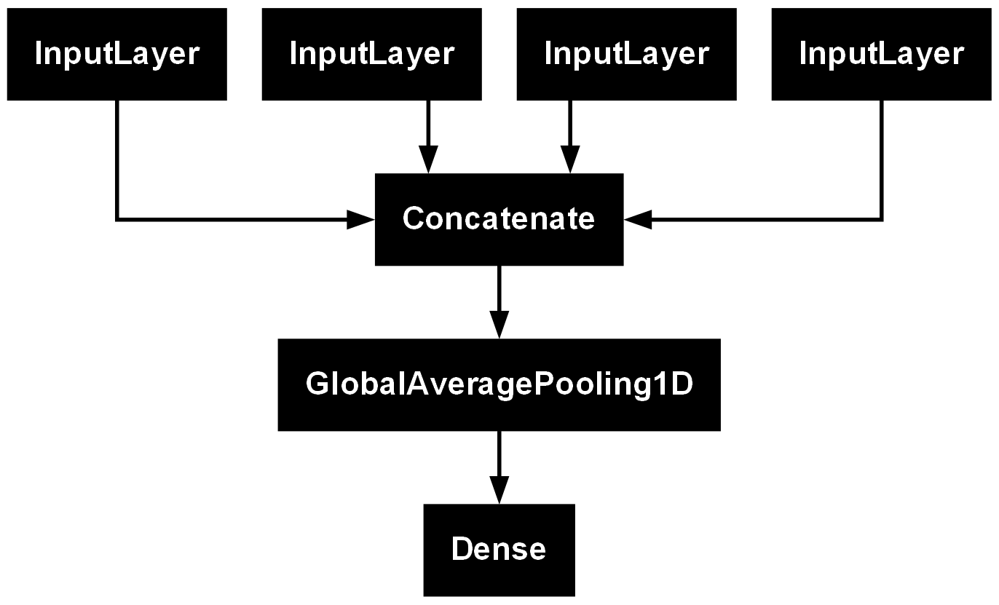

In [42]:
# Model Schema
keras.utils.plot_model(model_concat)

In [43]:
# Model COmpile
model_concat.compile(optimizer="adam", 
                     metrics=["accuracy"], 
                     loss="sparse_categorical_crossentropy")

In [44]:
print(f"Shape X0_train : {X0_train.shape}")
print(f"Shape X1_train : {X1_train.shape}")  
print(f"Shape de X2_train : {X2_train.shape}")  

Shape X0_train : (1808, 500, 682)
Shape X1_train : (1808, 500, 16)
Shape de X2_train : (1808, 500, 54)


In [45]:
# Train Unified Architecture
history_unified = model_concat.fit(
    x=[X0_train, X1_train, X2_train, X3_train], 
    y=y_train.reshape(y_train.shape[0], 1), 
    epochs=20 
)


Epoch 1/20


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor', 'keras_tensor_1', 'keras_tensor_2', 'keras_tensor_3']. Received: the structure of inputs=('*', '*', '*', '*')
  warnings.warn(


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.3897 - loss: 8.1359
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6456 - loss: 1.7081
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7413 - loss: 0.9471
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8057 - loss: 0.6225
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.8372 - loss: 0.4268
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8898 - loss: 0.3335
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8933 - loss: 0.2815
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9170 - loss: 0.2343
Epoch 9/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9448 - loss: 0.1852
Epoch 10/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9405 - loss: 0.1830
Epoch 11/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9034 - loss: 0.2736
Epoch 12/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9441 - l

In [46]:
# Make predictions for both models
y_pred_unified = model_concat.predict([X0_test, X1_test, X2_test, X3_test])
y_pred_unified_classes = np.argmax(y_pred_unified, axis=1)
# Compute confusion matrices
conf_matrix_unified = confusion_matrix(y_test, y_pred_unified_classes)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Average score accuracy : 0.94


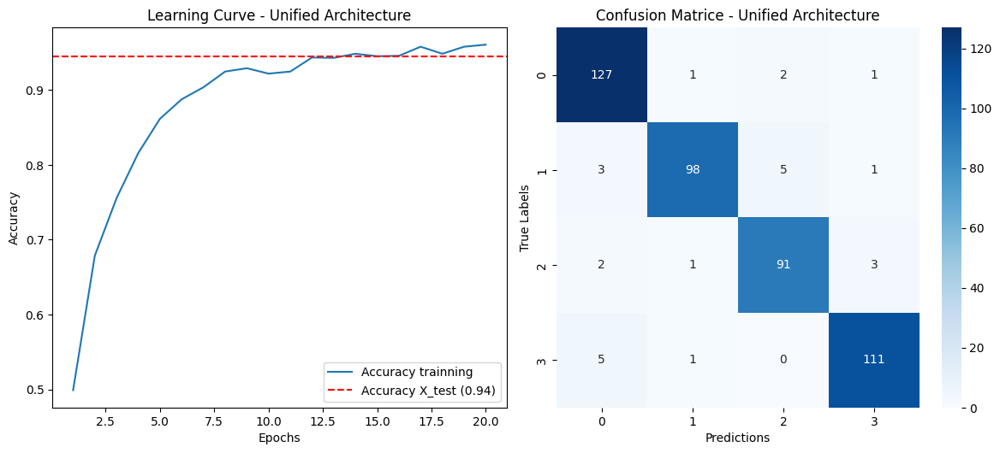

In [47]:
# ------------------------ Plotting Results ------------------------
# Make predictions for both models
y_pred_unified = model_concat.predict([X0_test, X1_test, X2_test, X3_test])
y_pred_unified_classes = np.argmax(y_pred_unified, axis=1)

# Compute confusion matrix
conf_matrix_unified = confusion_matrix(y_test, y_pred_unified_classes)

# Compute average accuracy score
average_accuracy = accuracy_score(y_test, y_pred_unified_classes)
print(f"Average score accuracy : {average_accuracy:.2f}")

# Courbes d'apprentissage - Unified Architecture
plt.figure(figsize=(12, 10))

# Courbe d'apprentissage
plt.subplot(2, 2, 1)
epochs = range(1, len(history_unified.history['accuracy']) + 1)  # Définir les époques
plt.plot(epochs, history_unified.history['accuracy'], label='Accuracy trainning')
# Ajouter une ligne horizontale pointillée pour le résultat X_test
plt.axhline(y=average_accuracy, color='red', linestyle='--', label=f'Accuracy X_test ({average_accuracy:.2f})')
plt.title('Learning Curve - Unified Architecture')
plt.xlabel('Epochs')  # Abscisse pour les époques
plt.ylabel('Accuracy')  # Ordonnée pour la précision
plt.legend()

# Matrice de confusion
plt.subplot(2, 2, 2)
sns.heatmap(conf_matrix_unified, annot=True, fmt="d", cmap="Blues",
            xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.xlabel('Predictions')
plt.ylabel('True Labels')
plt.title('Confusion Matrice - Unified Architecture')

plt.tight_layout()
plt.show()

In [48]:
# pip install matplotlib seaborn

In [49]:
# evaluate the model
model_concat.evaluate([X0_test, X1_test, X2_test, X3_test], y=y_test.reshape(y_test.shape[0], 1))

 2/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9922 - loss: 0.0768 

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor', 'keras_tensor_1', 'keras_tensor_2', 'keras_tensor_3']. Received: the structure of inputs=('*', '*', '*', '*')
  warnings.warn(


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9494 - loss: 0.1537


[0.1638280600309372, 0.9446902871131897]

In [50]:
# Make prediction and perform some metrics
predictions = model_concat.predict([X0_test, X1_test, X2_test, X3_test])
predictions = np.argmax(predictions, axis=-1)
print("Accuracy: ", accuracy_score(y_test, predictions))
print("F1 score: ", f1_score(y_test, predictions, average="weighted"))
print(classification_report(y_test, predictions))

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Accuracy:  0.9446902654867256
F1 score:  0.944675592207859
              precision    recall  f1-score   support

           0       0.93      0.97      0.95       131
           1       0.97      0.92      0.94       107
           2       0.93      0.94      0.93        97
           3       0.96      0.95      0.95       117

    accuracy                           0.94       452
   macro avg       0.95      0.94      0.94       452
weighted avg       0.95      0.94      0.94       452



### Unify Architecture : LOGO

In [51]:
def create_windowed_data(X, y, participants, seq_length=500, stride=50):
    """
    Apply sliding windowed (with configurable stride) on all modalities and their labels.
    
    Parameters:
        X : List containing modalities [X0, X1, X2, X3]
        y : List containing aligned labels
        participants : List containing participant IDs
        seq_length : Window length
        stride : stride length
    
    Returns:
        X_windowed : list - Windows for each modality
        y_windowed : list - Labels associated with windows
        participants_windowed : list - Participant IDs for each window
    """
    X_windowed_logo = [[], [], [], []]  # Windows for X0, X1, X2, X3
    y_windowed_logo = []
    participants_windowed_logo = []  # Track participant IDs for each window

    for i in range(0, len(y) - seq_length + 1, stride):
        # Window each modality
        for j, modality in enumerate(X):
            X_windowed_logo[j].append(modality[i:i + seq_length])

        # Add label for each window based on mode (majority label)
        window_labels = y[i:i + seq_length].tolist()  # Convert to list
        y_windowed_logo.append(max(set(window_labels), key=window_labels.count))
        
        # Track participant ID for this window
        participants_windowed_logo.append(participants[i])

    # Convert to numpy arrays
    X_windowed_logo = [np.array(modality) for modality in X_windowed_logo]
    y_windowed_logo = np.array(y_windowed_logo)
    participants_windowed_logo = np.array(participants_windowed_logo)

    return X_windowed_logo, y_windowed_logo, participants_windowed_logo

def prepare_logo_split(X0, X1, X2, X3, y, participants):
    """
    Prepare LOGO split: train on first 20 participants, test on last 5.
    
    Args:
        X0, X1, X2, X3: Input data for each modality
        y: Labels
        participants: Array of participant IDs
    """
    # Get unique participants and sort them
    unique_participants = np.sort(np.unique(participants))
    
    # Split participants: first 20 for training, last 5 for testing
    train_participants = unique_participants[:21]
    test_participants = unique_participants[21:]
    
    # Create masks for train and test sets
    train_mask = np.isin(participants, train_participants)
    test_mask = np.isin(participants, test_participants)
    
    # Split data
    X0_train_logo = X0[train_mask]
    X1_train_logo = X1[train_mask]
    X2_train_logo = X2[train_mask]
    X3_train_logo = X3[train_mask]
    y_train_logo = y[train_mask]
    
    X0_test_logo = X0[test_mask]
    X1_test_logo = X1[test_mask]
    X2_test_logo = X2[test_mask]
    X3_test_logo = X3[test_mask]
    y_test_logo = y[test_mask]
    
    return (X0_train_logo, X1_train_logo, X2_train_logo, X3_train_logo, y_train_logo, 
            X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo, y_test_logo)

def create_unified_model(input_shapes, num_classes):
    """Create unified architecture model"""
    # Input layers
    input_ips = Input(shape=input_shapes[0], dtype='float32')
    input_emg = Input(shape=input_shapes[1], dtype='float32')
    input_imu = Input(shape=input_shapes[2], dtype='float32')
    input_mocap = Input(shape=input_shapes[3], dtype='float32')
    
    # Concatenate inputs
    x_concat = concatenate([input_ips, input_emg, input_imu, input_mocap], axis=-1)
    
    # Dense layers
    x = Dense(100, activation='relu')(x_concat)
    x = Dense(50, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    
    # Output layer
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs=[input_ips, input_emg, input_imu, input_mocap], outputs=outputs)

def train_and_evaluate_model(model, X_train, X_test, y_train, y_test, le, model_name="Model"):
    """Train and evaluate a model"""
    # Compile model
    model.compile(optimizer="adam", 
                 loss="sparse_categorical_crossentropy", 
                 metrics=["accuracy"])
    
    # Train model
    history_logo = model.fit(
        x=X_train,
        y=y_train,
        epochs=20,
        #validation_data=(X_test, y_test),
        verbose=1
    )
    
    # Evaluate model
    predictions = model.predict(X_test)
    predictions = np.argmax(predictions, axis=-1)
    
    # Print metrics
    print(f"\n{model_name} Results:")
    print("Accuracy:", accuracy_score(y_test, predictions))
    print("F1 score:", f1_score(y_test, predictions, average="weighted"))
    print("\nClassification Report:")
    print(classification_report(y_test, predictions))
    
    # Plot confusion matrix
    cm = confusion_matrix(y_test, predictions)
    return model, history_logo, cm

def create_small_dataset(processed_emg, processed_imu, processed_ips, processed_mocap, 
                          n_participants=5, n_samples_per_participant=1000):
    """
    Create a small subset of the data for testing purposes.
    
    Args:
        processed_emg, processed_imu, processed_ips, processed_mocap: Original processed dataframes
        n_participants: Number of participants to include
        n_samples_per_participant: Number of samples per participant
    
    Returns:
        small_emg, small_imu, small_ips, small_mocap: Smaller versions of the processed dataframes
    """
    # Get n_participants unique participants
    participants = processed_emg['participant'].unique()[:n_participants]
    
    # Initialize empty dataframes
    small_emg = pd.DataFrame()
    small_imu = pd.DataFrame()
    small_ips = pd.DataFrame()
    small_mocap = pd.DataFrame() if not processed_mocap.empty else pd.DataFrame()
    
    # For each participant, get n_samples_per_participant samples
    for participant in participants:
        # Get participant data
        emg_participant = processed_emg[processed_emg['participant'] == participant].head(n_samples_per_participant)
        imu_participant = processed_imu[processed_imu['participant'] == participant].head(n_samples_per_participant)
        ips_participant = processed_ips[processed_ips['participant'] == participant].head(n_samples_per_participant)
        
        # Append to small datasets
        small_emg = pd.concat([small_emg, emg_participant])
        small_imu = pd.concat([small_imu, imu_participant])
        small_ips = pd.concat([small_ips, ips_participant])
        
        # Append MoCap data if it exists
        if not processed_mocap.empty:
            mocap_participant = processed_mocap[processed_mocap['participant'] == participant].head(n_samples_per_participant)
            small_mocap = pd.concat([small_mocap, mocap_participant])
    
    # Reset indices
    small_emg = small_emg.reset_index(drop=True)
    small_imu = small_imu.reset_index(drop=True)
    small_ips = small_ips.reset_index(drop=True)
    small_mocap = small_mocap.reset_index(drop=True) if not processed_mocap.empty else pd.DataFrame()
    
    print("Small dataset shapes:")
    print(f"EMG: {small_emg.shape}")
    print(f"IMU: {small_imu.shape}")
    print(f"IPS: {small_ips.shape}")
    print(f"MoCap: {small_mocap.shape if not processed_mocap.empty else 'No MoCap data'}")
    
    return small_emg, small_imu, small_ips, small_mocap

# Main execution
if __name__ == "__main__":
    # Choose dataset: 'full' or 'small'
    dataset_choice = 'full'  # Change to 'full' to use full datasets

    if dataset_choice == 'full':
        # Load your processed data here
        processed_emg = pd.read_csv('data_processed/processed_emg.csv')
        processed_imu = pd.read_csv('data_processed/processed_imu.csv')
        processed_ips = pd.read_csv('data_processed/processed_ips.csv')
        processed_mocap = pd.read_csv('data_processed/processed_mocap.csv')
    elif dataset_choice == 'small':
        # Load your small processed data here
        processed_emg = pd.read_csv('data_processed/processed_emg.csv')
        processed_imu = pd.read_csv('data_processed/processed_imu.csv')
        processed_ips = pd.read_csv('data_processed/processed_ips.csv')
        processed_mocap = pd.read_csv('data_processed/processed_mocap.csv')

        # Create small datasets
        small_emg, small_imu, small_ips, small_mocap = create_small_dataset(
            processed_emg, 
            processed_imu, 
            processed_ips,
            processed_mocap,
            n_participants=25,  # Using only 18 participants
            n_samples_per_participant=3000  # Using 1500 samples per participant
        )

        # Save small datasets
        small_emg.to_csv('data_processed/small_emg.csv', index=False)
        small_imu.to_csv('data_processed/small_imu.csv', index=False)
        small_ips.to_csv('data_processed/small_ips.csv', index=False)
        if not small_mocap.empty:
            small_mocap.to_csv('data_processed/small_mocap.csv', index=False)

        # Use small datasets for LOGO repartition
        processed_emg = small_emg
        processed_imu = small_imu
        processed_ips = small_ips
        processed_mocap = small_mocap

    # Add 'id' column to each dataframe
    for df in [processed_emg, processed_imu, processed_ips, processed_mocap]:
        df.insert(0, 'id', range(len(df)))

    # Create windowed data
    seq_length = 500  # Window length
    stride = 50       # Stride length
    
    # Create windows from your aligned data
    X_windowed_logo, y_windowed_logo, participants_windowed_logo = create_windowed_data(
        X=[processed_emg.drop(['id', 'participant', 'activity', 'timestamp'], axis=1).values,
           processed_imu.drop(['id', 'participant', 'activity', 'timestamp'], axis=1).values,
           processed_ips.drop(['id', 'participant', 'activity', 'timestamp'], axis=1).values,
           processed_mocap.drop(['id', 'participant', 'activity', 'timestamp'], axis=1).values],
        y=processed_emg['activity'].values,
        participants=processed_emg['participant'].values,
        seq_length=seq_length,
        stride=stride
    )
    
    # Label encoding
    le = LabelEncoder()
    y_encoded_logo = le.fit_transform(y_windowed_logo)
    
    # Prepare LOGO split using windowed data
    (X0_train_logo, X1_train_logo, X2_train_logo, X3_train_logo, y_train_logo,
     X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo, y_test_logo) = prepare_logo_split(
        X_windowed_logo[0], X_windowed_logo[1], X_windowed_logo[2], X_windowed_logo[3], 
        y_encoded_logo, 
        participants_windowed_logo
    )
    
    # Get input shapes and number of classes
    input_shapes = [
        (seq_length, X0_train_logo.shape[2]),  # Shape now includes sequence length
        (seq_length, X1_train_logo.shape[2]),
        (seq_length, X2_train_logo.shape[2]),
        (seq_length, X3_train_logo.shape[2])
    ]
    num_classes = len(np.unique(y_encoded_logo))
    
    # Print dataset information
    print("\nDataset Information:")
    print(f"Number of training samples: {len(y_train_logo)}")
    print(f"Number of test samples: {len(y_test_logo)}")
    print(f"Number of classes: {num_classes}")
    print(f"Input shapes: {input_shapes}")


Dataset Information:
Number of training samples: 1971
Number of test samples: 289
Number of classes: 4
Input shapes: [(500, 16), (500, 54), (500, 682), (500, 78)]


In [52]:
# Train and evaluate unified architecture
unified_model = create_unified_model(input_shapes, num_classes)
unified_model_logo, unified_history_logo, conf_matrix_unified = train_and_evaluate_model(
    unified_model,
    [X0_train_logo, X1_train_logo, X2_train_logo, X3_train_logo],
    [X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo],
    y_train_logo,
    y_test_logo,
    le)


Epoch 1/20


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_9', 'keras_tensor_10', 'keras_tensor_11', 'keras_tensor_12']. Received: the structure of inputs=('*', '*', '*', '*')
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - accuracy: 0.5563 - loss: 5.0935
Epoch 2/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - accuracy: 0.8905 - loss: 0.6445
Epoch 3/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - accuracy: 0.9489 - loss: 0.2244
Epoch 4/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - accuracy: 0.9482 - loss: 0.2253
Epoch 5/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.9537 - loss: 0.2140
Epoch 6/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.9609 - loss: 0.1216
Epoch 7/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.9513 - loss: 0.1654
Epoch 8/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.9643 - loss: 0.1283
Epoch 9/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.9588 - loss: 0.1398
Epoch 10/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.9678 - loss: 0.1583
Epoch 11/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.9718 - loss: 0.1083
Epoch 12/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.9673 - l

#### Results presentation

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


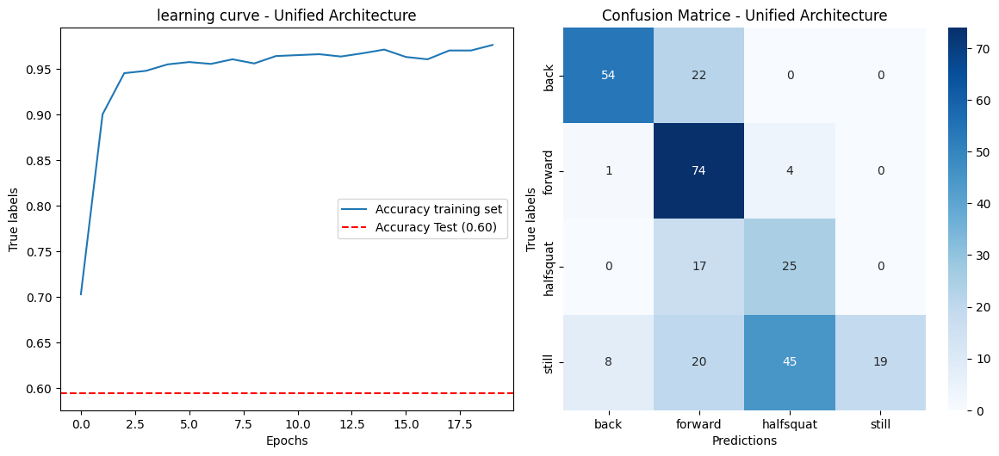

In [53]:
# Make predictions and calculate some metrics for plot
y_pred_unified_logo = unified_model_logo.predict([X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo])
y_pred_unified_classes_logo = np.argmax(y_pred_unified_logo, axis=1)  # Prédictions pour X_test
accuracy_test = accuracy_score(y_test_logo, y_pred_unified_classes_logo)  # Précision dynamique

# Plot training history
plt.figure(figsize=(12, 10))

# Learning curves - Unified Architecture
plt.subplot(2, 2, 1)
plt.plot(unified_history_logo.history['accuracy'], label='Accuracy training set')
# plot accuracy X_test
plt.axhline(y=accuracy_test, color='red', linestyle='--', label=f'Accuracy Test ({accuracy_test:.2f})')
plt.title('learning curve - Unified Architecture')
plt.xlabel('Epochs')
plt.ylabel('True labels')
plt.legend()

# Confusion matrix - Unified Architecture
plt.subplot(2, 2, 2)
sns.heatmap(conf_matrix_unified, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predictions')
plt.ylabel('True labels')
plt.title('Confusion Matrice - Unified Architecture')

plt.tight_layout()
plt.show()

⚠️ Comment: 

This code outlines a workflow for training and evaluating a multimodal deep learning model using sliding window segmentation and Leave-One-Group-Out (LOGO) cross-validation. The `create_windowed_data` function segments multimodal time-series data (EMG, IMU, IPS, MoCap) into fixed-length windows with overlapping strides, assigning labels based on majority class. LOGO splits the data by participants, ensuring the model is trained on one group while testing on another. A unified architecture concatenates modality inputs, applies dense layers, and uses softmax for classification. A small dataset creation function enables faster testing. The model is trained and evaluated on metrics like accuracy, F1-score, and a confusion matrix, with results visualized through learning curves and heatmaps. This approach ensures robust performance evaluation while leveraging multimodal inputs for classification tasks.

### Multimodal architecture : Standard repartition

#### Model architecture design and training

In [55]:
# Define CNN structure
input_ips = keras.Input(shape=(seq_length, X0_train[0].shape[1],), dtype='float32')
x_ips = layers.Dense(100, activation="relu")(input_ips)
x_ips = layers.GlobalAveragePooling1D()(x_ips)

input_emg = keras.Input(shape=(seq_length, X1_train[0].shape[1],), dtype='float32')
x_emg = layers.Dense(100, activation="relu")(input_emg)
x_emg = layers.GlobalAveragePooling1D()(x_emg)

input_imu = keras.Input(shape=(seq_length, X2_train[0].shape[1],), dtype='float32')
x_imu = layers.Dense(100, activation="relu")(input_imu)
x_imu = layers.GlobalAveragePooling1D()(x_imu)

input_mocap = keras.Input(shape=(seq_length, X3_train[0].shape[1],), dtype='float32')
x_mocap = layers.Dense(100, activation="relu")(input_mocap)
x_mocap = layers.GlobalAveragePooling1D()(x_mocap)

# Cncate layers
x_concat = layers.concatenate([x_ips, x_emg, x_imu, x_mocap], axis=-1)

x = layers.Dense(100, activation='relu')(x_concat)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dense(len(np.unique(y)), activation='softmax')(x)

model_branch = keras.Model(inputs=[input_ips, input_emg, input_imu, input_mocap], outputs=x)

Global overage pooling 1D : .........

In [56]:
# display model structure
model_branch.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 500, 682)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_9       │ (None, 500, 16)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_10      │ (None, 500, 54)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_11      │ (None, 500, 78)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 500, 100)  │     68,300 │ input_layer_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 500, 100)  │      1,700 │ input_layer_9[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 500, 100)  │      5,500 │ input_layer_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 500, 100)  │      7,900 │ input_layer_11[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 100)       │          0 │ dense_6[0][0]     │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 100)       │          0 │ dense_7[0][0]     │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 100)       │          0 │ dense_8[0][0]     │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 100)       │          0 │ dense_9[0][0]     │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 400)       │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 100)       │     40,100 │ concatenate_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 50)        │      5,050 │ dense_10[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 4)         │        204 │ dense_11[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 128,754 (502.95 KB)

 Trainable params: 128,754 (502.95 KB)

 Non-trainable params: 0 (0.00 B)

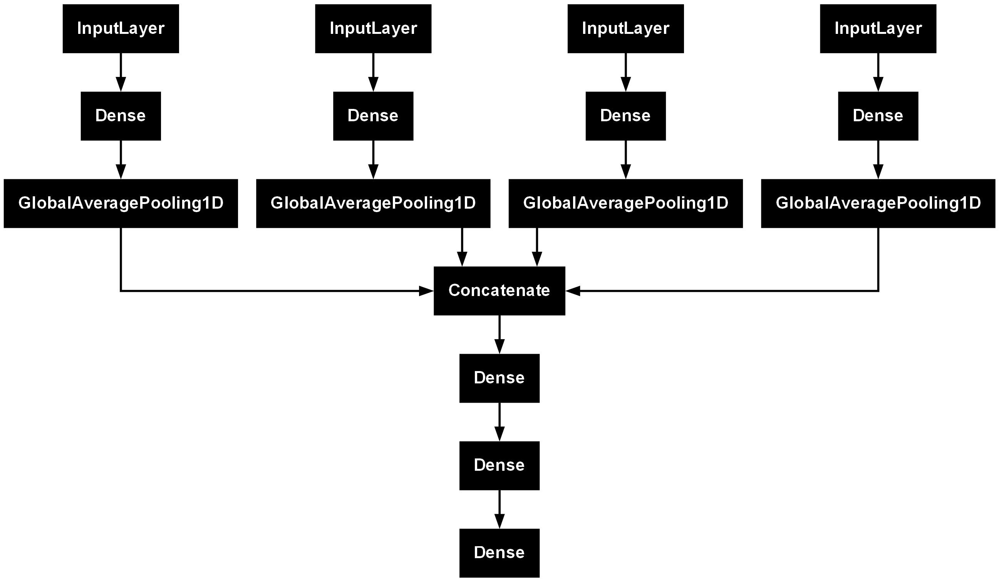

In [57]:
# Display model Schema
keras.utils.plot_model(model_branch)

In [58]:
# Compile the model
model_branch.compile(optimizer="adam", metrics=["accuracy"], loss="sparse_categorical_crossentropy")

In [59]:
# Train the model
model_branch.fit(x=[X0_train, X1_train, X2_train, X3_train], y=y_train.reshape(y_train.shape[0], 1), epochs=20)

Epoch 1/20


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_18', 'keras_tensor_21', 'keras_tensor_24', 'keras_tensor_27']. Received: the structure of inputs=('*', '*', '*', '*')
  warnings.warn(


57/57 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.5216 - loss: 4.1049
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.8997 - loss: 0.6079
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.8985 - loss: 0.6464
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.9465 - loss: 0.2026
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.9528 - loss: 0.2106
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.9549 - loss: 0.1935
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9537 - loss: 0.3060
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9534 - loss: 0.1515
Epoch 9/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.9620 - loss: 0.2617
Epoch 10/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.9631 - loss: 0.1454
Epoch 11/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.9532 - loss: 0.2872
Epoch 12/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.9733 - l

In [60]:
# Train Unified Architecture
history_multimodal = model_branch.fit(
    x=[X0_train, X1_train, X2_train, X3_train], 
    y=y_train.reshape(y_train.shape[0], 1), 
    epochs=20
)

Epoch 1/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.9814 - loss: 0.0708
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.9589 - loss: 0.1798
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.9751 - loss: 0.0937
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.9720 - loss: 0.1130
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.9702 - loss: 0.0709
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.9733 - loss: 0.0817
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.9703 - loss: 0.0890
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.9768 - loss: 0.0748
Epoch 9/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.9783 - loss: 0.0668
Epoch 10/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.9816 - loss: 0.0801
Epoch 11/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.9787 - loss: 0.0648
Epoch 12/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy:

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Accuracy:  0.9446902654867256
F1 Score (weighted):  0.9445090975783665
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.89      0.94       131
           1       0.91      0.99      0.95       107
           2       0.94      0.96      0.95        97
           3       0.94      0.96      0.95       117

    accuracy                           0.94       452
   macro avg       0.94      0.95      0.95       452
weighted avg       0.95      0.94      0.94       452



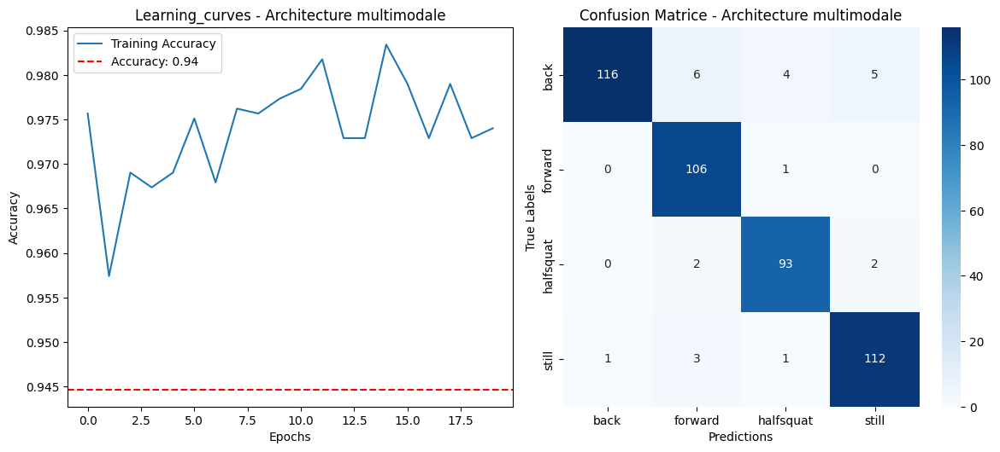

In [ ]:
# Prediction on multimodal modele
y_pred_multimodal = model_branch.predict([X0_test, X1_test, X2_test, X3_test])
y_pred_multimodal_classes = np.argmax(y_pred_multimodal, axis=1)

# Metrics performance
accuracy = accuracy_score(y_test, y_pred_multimodal_classes)
f1 = f1_score(y_test, y_pred_multimodal_classes, average="weighted")
print("Accuracy: ", accuracy)
print("F1 Score (weighted): ", f1)
print("Classification Report:\n", classification_report(y_test, y_pred_multimodal_classes))

# Confusion Matrice
conf_matrix_multimodal = confusion_matrix(y_test, y_pred_multimodal_classes)

# Graph size
plt.figure(figsize=(12, 10))

# Learning curve - Multimodale Architecture
plt.subplot(2, 2, 3)
plt.plot(history_multimodal.history['accuracy'], label='Training Accuracy')
# Plot Accuracy
plt.axhline(y=accuracy, color='red', linestyle='--', label=f'Accuracy: {accuracy:.2f}')

plt.title("Learning_curves - Architecture multimodale")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Display confusion matrice with subplots
plt.subplot(2, 2, 4)
sns.heatmap(conf_matrix_multimodal, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel("Predictions")
plt.ylabel("True Labels")
plt.title("Confusion Matrice - Architecture multimodale")

# Avoid overlapping and display plot
plt.tight_layout()
plt.show()

### Multimodal architecture : LOGO

In [63]:
def create_windowed_data(X, y, participants, seq_length=500, stride=50):
    """
    Apply sliding windowed (with configurable stride) on all modalities and their labels.
    
    Parameters:
        X : List containing modalities [X0, X1, X2, X3]
        y : List containing aligned labels
        participants : List containing participant IDs
        seq_length : Window length
        stride : stride length
    
    Returns:
        X_windowed : list - Windows for each modality
        y_windowed : list - Labels associated with windows
        participants_windowed : list - Participant IDs for each window
    """
    X_windowed_logo = [[], [], [], []]  # Windows for X0, X1, X2, X3
    y_windowed_logo = []
    participants_windowed_logo = []  # Track participant IDs for each window

    for i in range(0, len(y) - seq_length + 1, stride):
        # Window each modality
        for j, modality in enumerate(X):
            X_windowed_logo[j].append(modality[i:i + seq_length])

        # Add label for each window based on mode (majority label)
        window_labels = y[i:i + seq_length].tolist()  # Convert to list
        y_windowed_logo.append(max(set(window_labels), key=window_labels.count))
        
        # Track participant ID for this window
        participants_windowed_logo.append(participants[i])

    # Convert to numpy arrays
    X_windowed_logo = [np.array(modality) for modality in X_windowed_logo]
    y_windowed_logo = np.array(y_windowed_logo)
    participants_windowed_logo = np.array(participants_windowed_logo)

    return X_windowed_logo, y_windowed_logo, participants_windowed_logo

def prepare_logo_split(X0, X1, X2, X3, y, participants):
    """
    Prepare LOGO split: train on first 20 participants, test on last 5.
    
    Args:
        X0, X1, X2, X3: Input data for each modality
        y: Labels
        participants: Array of participant IDs
    """
    # Get unique participants and sort them
    unique_participants = np.sort(np.unique(participants))
    
    # Split participants: first 20 for training, last 5 for testing
    train_participants = unique_participants[:21]
    test_participants = unique_participants[21:]
    
    # Create masks for train and test sets
    train_mask = np.isin(participants, train_participants)
    test_mask = np.isin(participants, test_participants)
    
    # Split data
    X0_train_logo = X0[train_mask]
    X1_train_logo = X1[train_mask]
    X2_train_logo = X2[train_mask]
    X3_train_logo = X3[train_mask]
    y_train_logo = y[train_mask]
    
    X0_test_logo = X0[test_mask]
    X1_test_logo = X1[test_mask]
    X2_test_logo = X2[test_mask]
    X3_test_logo = X3[test_mask]
    y_test_logo = y[test_mask]
    
    return (X0_train_logo, X1_train_logo, X2_train_logo, X3_train_logo, y_train_logo, 
            X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo, y_test_logo)

def create_multimodal_model(seq_length, X0_train, X1_train, X2_train, X3_train, y):
    # Inputs for each modality
    input_ips = keras.Input(shape=(seq_length, X0_train[0].shape[1]), dtype='float32')  # IPS input
    x_ips = layers.Dense(100, activation="relu")(input_ips)
    x_ips = layers.GlobalAveragePooling1D()(x_ips)

    input_emg = keras.Input(shape=(seq_length, X1_train[0].shape[1]), dtype='float32')  # EMG input
    x_emg = layers.Dense(100, activation="relu")(input_emg)
    x_emg = layers.GlobalAveragePooling1D()(x_emg)

    input_imu = keras.Input(shape=(seq_length, X2_train[0].shape[1]), dtype='float32')  # IMU input
    x_imu = layers.Dense(100, activation="relu")(input_imu)
    x_imu = layers.GlobalAveragePooling1D()(x_imu)

    input_mocap = keras.Input(shape=(seq_length, X3_train[0].shape[1]), dtype='float32')  # Mocap input
    x_mocap = layers.Dense(100, activation="relu")(input_mocap)
    x_mocap = layers.GlobalAveragePooling1D()(x_mocap)

    # Concatenate the outputs from all modalities
    x_concat = layers.concatenate([x_ips, x_emg, x_imu, x_mocap], axis=-1)

    # Further dense layers after concatenation
    x = layers.Dense(100, activation='relu')(x_concat)
    x = layers.Dense(50, activation='relu')(x)
    x = layers.Dense(len(np.unique(y)), activation='softmax')(x)

    # Define the model with inputs and outputs
    model = keras.Model(inputs=[input_ips, input_emg, input_imu, input_mocap], outputs=x)
    
    return model

def train_and_evaluate_model(model, X_train, X_test, y_train, y_test, le, model_name="Model"):
    """Train and evaluate a model"""
    # Compile model
    model.compile(optimizer="adam", 
                 loss="sparse_categorical_crossentropy", 
                 metrics=["accuracy"])
    
    # Train model
    history_logo = model.fit(
        x=X_train,
        y=y_train,
        epochs=20,
        validation_data=(X_test, y_test),
        verbose=1
    )
    
    # Evaluate model
    predictions = model.predict(X_test)
    predictions = np.argmax(predictions, axis=-1)
    
    # Print metrics
    print(f"\n{model_name} Results:")
    print("Accuracy:", accuracy_score(y_test, predictions))
    print("F1 score:", f1_score(y_test, predictions, average="weighted"))
    print("\nClassification Report:")
    print(classification_report(y_test, predictions))
    
    # Plot confusion matrix
    cm = confusion_matrix(y_test, predictions)
    return model, history_logo, cm

def create_small_dataset(processed_emg, processed_imu, processed_ips, processed_mocap, 
                          n_participants=5, n_samples_per_participant=1000):
    """
    Create a small subset of the data for testing purposes.
    
    Args:
        processed_emg, processed_imu, processed_ips, processed_mocap: Original processed dataframes
        n_participants: Number of participants to include
        n_samples_per_participant: Number of samples per participant
    
    Returns:
        small_emg, small_imu, small_ips, small_mocap: Smaller versions of the processed dataframes
    """
    # Get n_participants unique participants
    participants = processed_emg['participant'].unique()[:n_participants]
    
    # Initialize empty dataframes
    small_emg = pd.DataFrame()
    small_imu = pd.DataFrame()
    small_ips = pd.DataFrame()
    small_mocap = pd.DataFrame() if not processed_mocap.empty else pd.DataFrame()
    
    # For each participant, get n_samples_per_participant samples
    for participant in participants:
        # Get participant data
        emg_participant = processed_emg[processed_emg['participant'] == participant].head(n_samples_per_participant)
        imu_participant = processed_imu[processed_imu['participant'] == participant].head(n_samples_per_participant)
        ips_participant = processed_ips[processed_ips['participant'] == participant].head(n_samples_per_participant)
        
        # Append to small datasets
        small_emg = pd.concat([small_emg, emg_participant])
        small_imu = pd.concat([small_imu, imu_participant])
        small_ips = pd.concat([small_ips, ips_participant])
        
        # Append MoCap data if it exists
        if not processed_mocap.empty:
            mocap_participant = processed_mocap[processed_mocap['participant'] == participant].head(n_samples_per_participant)
            small_mocap = pd.concat([small_mocap, mocap_participant])
    
    # Reset indices
    small_emg = small_emg.reset_index(drop=True)
    small_imu = small_imu.reset_index(drop=True)
    small_ips = small_ips.reset_index(drop=True)
    small_mocap = small_mocap.reset_index(drop=True) if not processed_mocap.empty else pd.DataFrame()
    
    print("Small dataset shapes:")
    print(f"EMG: {small_emg.shape}")
    print(f"IMU: {small_imu.shape}")
    print(f"IPS: {small_ips.shape}")
    print(f"MoCap: {small_mocap.shape if not processed_mocap.empty else 'No MoCap data'}")
    
    return small_emg, small_imu, small_ips, small_mocap

# Main execution
if __name__ == "__main__":
    # Choose dataset: 'full' or 'small'
    dataset_choice = 'full'  # Change to 'full' to use full datasets

    if dataset_choice == 'full':
        # Load your processed data here
        processed_emg = pd.read_csv('data_processed/processed_emg.csv')
        processed_imu = pd.read_csv('data_processed/processed_imu.csv')
        processed_ips = pd.read_csv('data_processed/processed_ips.csv')
        processed_mocap = pd.read_csv('data_processed/processed_mocap.csv')
    elif dataset_choice == 'small':
        # Load your small processed data here
        processed_emg = pd.read_csv('data_processed/processed_emg.csv')
        processed_imu = pd.read_csv('data_processed/processed_imu.csv')
        processed_ips = pd.read_csv('data_processed/processed_ips.csv')
        processed_mocap = pd.read_csv('data_processed/processed_mocap.csv')

        # Create small datasets
        small_emg, small_imu, small_ips, small_mocap = create_small_dataset(
            processed_emg, 
            processed_imu, 
            processed_ips,
            processed_mocap,
            n_participants=25,  # Using only 18 participants
            n_samples_per_participant=1000  # Using 1500 samples per participant
        )

        # Save small datasets
        small_emg.to_csv('data_processed/small_emg.csv', index=False)
        small_imu.to_csv('data_processed/small_imu.csv', index=False)
        small_ips.to_csv('data_processed/small_ips.csv', index=False)
        if not small_mocap.empty:
            small_mocap.to_csv('data_processed/small_mocap.csv', index=False)

        # Use small datasets for LOGO repartition
        processed_emg = small_emg
        processed_imu = small_imu
        processed_ips = small_ips
        processed_mocap = small_mocap

    # Add 'id' column to each dataframe
    for df in [processed_emg, processed_imu, processed_ips, processed_mocap]:
        df.insert(0, 'id', range(len(df)))

    # Create windowed data
    seq_length = 500  # Window length
    stride = 50     # Stride length
    
    # Create windows from your aligned data
    X_windowed_logo, y_windowed_logo, participants_windowed_logo = create_windowed_data(
        X=[processed_emg.drop(['id', 'participant', 'activity', 'timestamp'], axis=1).values,
           processed_imu.drop(['id', 'participant', 'activity', 'timestamp'], axis=1).values,
           processed_ips.drop(['id', 'participant', 'activity', 'timestamp'], axis=1).values,
           processed_mocap.drop(['id', 'participant', 'activity', 'timestamp'], axis=1).values],
        y=processed_emg['activity'].values,
        participants=processed_emg['participant'].values,
        seq_length=seq_length,
        stride=stride
    )
    
    # Label encoding
    le = LabelEncoder()
    y_encoded_logo = le.fit_transform(y_windowed_logo)
    
    # Prepare LOGO split using windowed data
    (X0_train_logo, X1_train_logo, X2_train_logo, X3_train_logo, y_train_logo,
     X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo, y_test_logo) = prepare_logo_split(
        X_windowed_logo[0], X_windowed_logo[1], X_windowed_logo[2], X_windowed_logo[3], 
        y_encoded_logo, 
        participants_windowed_logo
    )
    
    # Get input shapes and number of classes
    input_shapes = [
        (seq_length, X0_train_logo.shape[2]),  # Shape now includes sequence length
        (seq_length, X1_train_logo.shape[2]),
        (seq_length, X2_train_logo.shape[2]),
        (seq_length, X3_train_logo.shape[2])
    ]
    num_classes = len(np.unique(y_encoded_logo))
    
    # Print dataset information
    print("\nDataset Information:")
    print(f"Number of training samples: {len(y_train_logo)}")
    print(f"Number of test samples: {len(y_test_logo)}")
    print(f"Number of classes: {num_classes}")
    print(f"Input shapes: {input_shapes}")


Dataset Information:
Number of training samples: 1971
Number of test samples: 289
Number of classes: 4
Input shapes: [(500, 16), (500, 54), (500, 682), (500, 78)]


In [64]:
# Train and evaluate unified architecture
    
multimodal_model = create_multimodal_model(seq_length, X0_train_logo, X1_train_logo, X2_train_logo, X3_train_logo, y_train_logo) #create_multimodal_model(input_shapes, num_classes)
multimodal_model_logo, multimodal_history_logo, conf_matrix_multimodal = train_and_evaluate_model(
    multimodal_model,
    [X0_train_logo, X1_train_logo, X2_train_logo, X3_train_logo],
    [X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo],
    y_train_logo,
    y_test_logo,
    le,
    "Multimodal Architecture (LOGO)"
)

Epoch 1/20


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_34', 'keras_tensor_37', 'keras_tensor_40', 'keras_tensor_43']. Received: the structure of inputs=('*', '*', '*', '*')
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - accuracy: 0.5550 - loss: 3.4231 - val_accuracy: 0.5813 - val_loss: 4.7031
Epoch 2/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.8982 - loss: 1.1974 - val_accuracy: 0.5744 - val_loss: 4.2883
Epoch 3/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9505 - loss: 0.3457 - val_accuracy: 0.5260 - val_loss: 5.1021
Epoch 4/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9421 - loss: 0.4544 - val_accuracy: 0.5952 - val_loss: 4.9359
Epoch 5/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9450 - loss: 0.2815 - val_accuracy: 0.6851 - val_loss: 4.1330
Epoch 6/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.9414 - loss: 0.3572 - val_accuracy: 0.5363 - val_loss: 5.1437
Epoch 7/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9511 - loss: 0.3363 - val_accuracy: 0.5294 - val_loss: 5.3554
Epoch 8/20
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.9443 - loss: 0.1789 - val_accuracy: 0.5363 - val_loss: 5

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


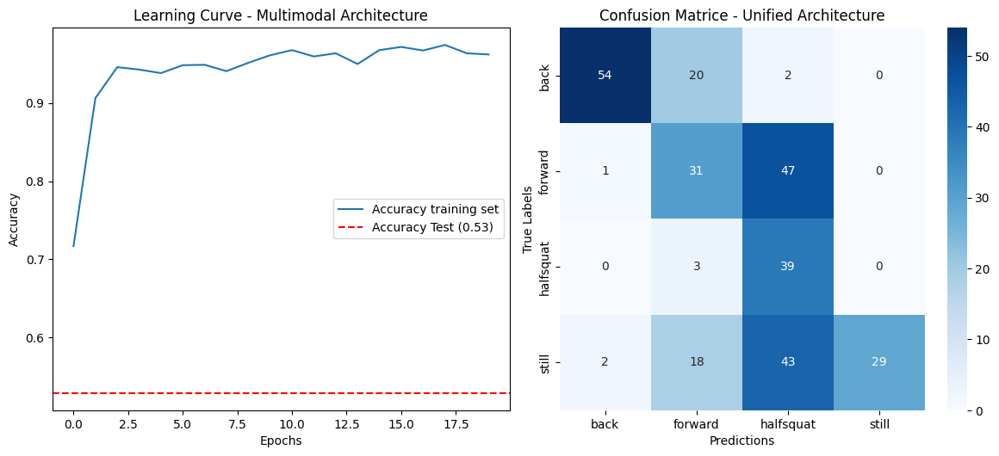

In [65]:
# Make prediction
y_pred_multi_logo = multimodal_model_logo.predict([X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo])
y_pred_multi_classes_logo = np.argmax(y_pred_multi_logo, axis=1)  # Prédictions pour X_test
accuracy_test = accuracy_score(y_test_logo, y_pred_multi_classes_logo)  # Précision dynamique

# Plot training history
plt.figure(figsize=(12, 10))

# Learning curves - Unified Architecture
plt.subplot(2, 2, 1)
plt.plot(multimodal_history_logo.history['accuracy'], label='Accuracy training set')
# Ajouter une ligne horizontale pointillée pour la précision sur X_test
plt.axhline(y=accuracy_test, color='red', linestyle='--', label=f'Accuracy Test ({accuracy_test:.2f})')
#plt.plot(multimodal_history_logo.history['val_accuracy'], label='Précision de validation')
plt.title('Learning Curve - Multimodal Architecture')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Confusion matrix - Unified Architecture
plt.subplot(2, 2, 2)
sns.heatmap(conf_matrix_multimodal, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predictions')
plt.ylabel('True Labels')
plt.title('Confusion Matrice - Unified Architecture')

plt.tight_layout()
plt.show()

⚠️ Comment: 

Here the script logic is the same as for the previous LOGO model, the only thing changing here is the model architecture design which is design to handle modalities from multiples input and concatenate only the output comming from each input.

### Applying a GridSearch and Random Search on Two models

**Grid Search** and **Random Search** are techniques for hyperparameter optimization, which is the process of finding the best combination of parameters for a machine learning model.

I. **Grid Search**:
- **Method**: It systematically searches through a specified set of hyperparameter values.
- **Process**: Creates a grid of all possible combinations of hyperparameters and evaluates the model for each combination.
- **Advantage**: Exhaustive; ensures the optimal combination within the defined search space is found.
- **Disadvantage**: Computationally expensive, especially with a large number of hyperparameters or wide ranges.

II. **Random Search**:
- **Method**: Randomly samples hyperparameter combinations from a predefined search space.
- **Process**: Selects a fixed number of random combinations and evaluates the model for each.
- **Advantage**: Faster than grid search; often performs comparably with fewer evaluations.
- **Disadvantage**: May miss the optimal combination if not enough samples are evaluated.

In practice, **random search** is often preferred for complex models or large datasets due to its efficiency, while **grid search** is useful when the search space is small or the model is simpler.

##### Unified model (standard Repartition): GridSearch

In [67]:
# pip install pydot and install graphviz.exe to read the photo

In [68]:
print(f"Shape of X0_train : {X0_train.shape}")
print(f"Shape of X1_train : {X1_train.shape}")  
print(f"Shape of X2_train : {X2_train.shape}")
print(f"Shape of X3_train : {X3_train.shape}")

Shape of X0_train : (1808, 500, 682)
Shape of X1_train : (1808, 500, 16)
Shape of X2_train : (1808, 500, 54)
Shape of X3_train : (1808, 500, 78)


In [69]:
print(f"Shape of y_train : {y_train.shape}")

Shape of y_train : (1808,)


In [70]:
# Concatenate X_train sets
X_train_combined = np.concatenate([X0_train, X1_train, X2_train, X3_train], axis=-1)

In [71]:
# Build models
def build_model(learning_rate=0.001, dense_units_1=100, dense_units_2=50):
    input_data = Input(shape=(500, X_train_combined.shape[2]), dtype='float32')
    x = layers.Dense(dense_units_1, activation='relu')(input_data)
    x = layers.Dense(dense_units_2, activation='relu')(x)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(len(np.unique(y_train)), activation='softmax')(x)
    
    model = Model(inputs=input_data, outputs=x)
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  metrics=["accuracy"], 
                  loss="sparse_categorical_crossentropy")
    return model

In [72]:
# Instanciate model functions to visualize summary, Input and plot_model
model_unified = build_model(learning_rate=0.001, dense_units_1=100, dense_units_2=50)

In [ ]:
# Display model structure
model_unified.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)     │ (None, 500, 830)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 500, 100)       │        83,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 500, 50)        │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_10     │ (None, 50)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 4)              │           204 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,354 (345.13 KB)

 Trainable params: 88,354 (345.13 KB)

 Non-trainable params: 0 (0.00 B)

In [74]:
# Check Input models
print(model_unified.input)

<KerasTensor shape=(None, 500, 830), dtype=float32, sparse=False, name=keras_tensor_50>


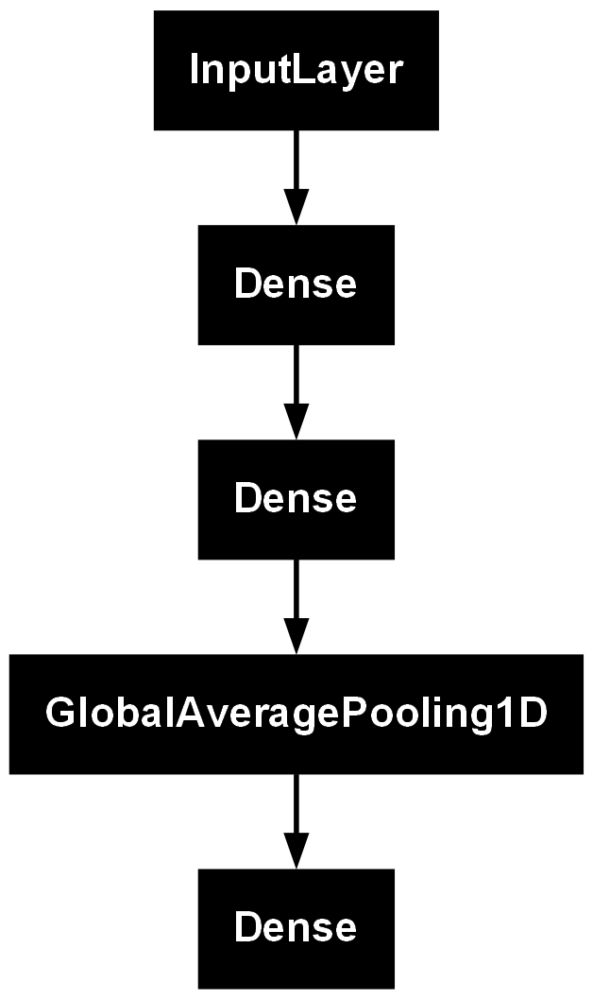

In [ ]:
# Display model Schema
keras.utils.plot_model(model_unified)

In [93]:
# Concatenate X_test sets for Unified model
X_test_combined = np.concatenate([X0_test, X1_test, X2_test, X3_test], axis=-1)

# Convert to float32
X_test_combined = X_test_combined.astype(np.float32)

print(f"X_tes_combined shape: {X_test_combined.shape}")
print(f"y_test shape: {y_test.shape}")

X_tes_combined shape: (452, 500, 830)
y_test shape: (452,)


In [94]:
# Define dictionnary with griedsearch parameters
param_grid = {
    'learning_rate': [0.001, 0.01],
    'dense_units_1': [100, 200],
    'dense_units_2': [50, 100],
    'batch_size': [32],
    'epochs': [20]
}

We can't use more hyparameters because of our RAM limit memory

In [95]:
# Define Keras classifier for perform gridsearch on model
classifier = KerasClassifier(
    build_fn=build_model,   # Fonction pour construire le modèle
    learning_rate=0.001,    # Paramètres de build_model
    dense_units_1=100,      # Paramètres de build_model
    dense_units_2=50,       # Paramètres de build_model
    epochs=20,              # Paramètre propre au KerasClassifier
    batch_size=32,          # Paramètre propre au KerasClassifier
    verbose=1               # Paramètre propre au KerasClassifier
)

In [96]:
# print hyper parameters
print(classifier.get_params().keys())

dict_keys(['model', 'build_fn', 'warm_start', 'random_state', 'optimizer', 'loss', 'metrics', 'batch_size', 'validation_batch_size', 'verbose', 'callbacks', 'validation_split', 'shuffle', 'run_eagerly', 'epochs', 'learning_rate', 'dense_units_1', 'dense_units_2', 'class_weight'])


In [97]:
# Perform gridsearch
grid = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=3, n_jobs = 1)

In [91]:
# Training model with gridsearch CV
grid_result = grid.fit(X_train_combined, y_train)

print(f"Best Score: {grid_result.best_score_}")
print(f"Best Params: {grid_result.best_params_}")

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - accuracy: 0.5405 - loss: 3.2695
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8395 - loss: 0.7141
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8903 - loss: 1.0553
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9266 - loss: 0.4318
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9437 - loss: 0.2276
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9475 - loss: 0.2373
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9653 - loss: 0.1425
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9745 - loss: 0.0908
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9617 - loss: 0.3275
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9588 - loss: 0.2006
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9573 - loss: 0.2393
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.4500 - loss: 4.1515
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8574 - loss: 0.6170
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9186 - loss: 0.4466
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9396 - loss: 0.3442
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9416 - loss: 0.2055
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9589 - loss: 0.1959
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9496 - loss: 0.2698
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9458 - loss: 0.2188
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9506 - loss: 0.1679
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9722 - loss: 0.0952
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9597 - loss: 0.1169
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.4890 - loss: 3.6916
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8291 - loss: 0.9810
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9120 - loss: 0.3925
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9511 - loss: 0.2290
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9528 - loss: 0.3384
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9705 - loss: 0.1145
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9608 - loss: 0.3346
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9333 - loss: 0.5953
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9750 - loss: 0.1497
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9609 - loss: 0.2098
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9684 - loss: 0.1856
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.4041 - loss: 8.2110
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7074 - loss: 0.6999
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7933 - loss: 0.5378
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8639 - loss: 0.3546
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8940 - loss: 0.2774
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9209 - loss: 0.2004
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9336 - loss: 0.1822
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9094 - loss: 0.2172
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9361 - loss: 0.1597
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9350 - loss: 0.1651
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9426 - loss: 0.1391
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.3986 - loss: 8.8051
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.6852 - loss: 0.7928
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7974 - loss: 0.5577
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8467 - loss: 0.4277
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8792 - loss: 0.3323
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8710 - loss: 0.3270
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.8828 - loss: 0.2644
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.8900 - loss: 0.2936
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9246 - loss: 0.2170
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9137 - loss: 0.2268
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9506 - loss: 0.1414
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - accuracy: 0.4818 - loss: 8.2515
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7804 - loss: 0.6497
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8536 - loss: 0.4770
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8930 - loss: 0.3202
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.8999 - loss: 0.2241
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9269 - loss: 0.1858
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9340 - loss: 0.1708
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9384 - loss: 0.1567
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9473 - loss: 0.1653
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9430 - loss: 0.1595
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9595 - loss: 0.1052
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.5481 - loss: 3.2619
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8494 - loss: 0.8857
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9175 - loss: 0.4056
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9505 - loss: 0.3277
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9321 - loss: 0.2287
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.9440 - loss: 0.6293
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.9654 - loss: 0.1168
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.9675 - loss: 0.1583
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9665 - loss: 0.1255
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9730 - loss: 0.1060
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9638 - loss: 0.2148
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.4465 - loss: 4.2812
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8729 - loss: 0.6199
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9354 - loss: 0.3582
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9314 - loss: 0.6209
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9303 - loss: 0.4448
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9652 - loss: 0.1141
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9663 - loss: 0.1466
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9728 - loss: 0.2147
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9656 - loss: 0.1252
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9658 - loss: 0.1131
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9744 - loss: 0.0819
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.5055 - loss: 3.8880
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8622 - loss: 0.7978
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9341 - loss: 0.3139
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9454 - loss: 0.5137
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9403 - loss: 0.3612
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9390 - loss: 0.3680
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9616 - loss: 0.2555
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9397 - loss: 0.4396
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9571 - loss: 0.2034
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9684 - loss: 0.1599
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9635 - loss: 0.1885
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.4732 - loss: 7.7487
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.7960 - loss: 0.6178
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8403 - loss: 0.4027
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8834 - loss: 0.3305
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9186 - loss: 0.2168
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9378 - loss: 0.2971
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9401 - loss: 0.2063
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9447 - loss: 0.1722
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9115 - loss: 0.3314
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9429 - loss: 0.1670
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9632 - loss: 0.1044
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.4443 - loss: 9.5603
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6492 - loss: 1.0637
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7761 - loss: 0.5428
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8495 - loss: 0.4748
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8986 - loss: 0.2608
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9128 - loss: 0.2386
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9354 - loss: 0.1990
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9592 - loss: 0.1387
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9714 - loss: 0.0912
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9533 - loss: 0.1667
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9669 - loss: 0.0899
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.3839 - loss: 15.4031
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.7459 - loss: 0.9304
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8435 - loss: 0.4219
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9007 - loss: 0.2767
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9179 - loss: 0.2288
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9220 - loss: 0.2066
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9305 - loss: 0.1982
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9516 - loss: 0.1254
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9492 - loss: 0.1419
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9536 - loss: 0.1220
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9741 - loss: 0.0920
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.5399 - loss: 3.7102
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9025 - loss: 0.4541
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9118 - loss: 0.5188
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9264 - loss: 0.3699
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9543 - loss: 0.3529
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9415 - loss: 0.2701
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9546 - loss: 0.3145
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9453 - loss: 0.2008
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9686 - loss: 0.0937
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9617 - loss: 0.1953
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9491 - loss: 0.2976
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.4434 - loss: 5.5708
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8632 - loss: 0.9898
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9133 - loss: 0.6208
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9445 - loss: 0.3688
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9573 - loss: 0.3821
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9629 - loss: 0.1459
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9696 - loss: 0.1377
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9505 - loss: 0.7666
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9626 - loss: 0.5056
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9676 - loss: 0.0896
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9724 - loss: 0.1168
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.5182 - loss: 5.5715
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8510 - loss: 0.4987
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8995 - loss: 0.4664
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9150 - loss: 1.0989
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9507 - loss: 0.2546
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9347 - loss: 0.3150
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9538 - loss: 0.2440
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9845 - loss: 0.0974
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9642 - loss: 0.1512
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9483 - loss: 0.2130
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9611 - loss: 0.1748
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - accuracy: 0.4554 - loss: 20.4938
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.7841 - loss: 0.5315
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8203 - loss: 0.4243
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8844 - loss: 0.2724
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8804 - loss: 0.2779
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9252 - loss: 0.1841
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9275 - loss: 0.2005
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9413 - loss: 0.1561
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9399 - loss: 0.1657
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9370 - loss: 0.1473
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9451 - loss: 0.1266
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.4710 - loss: 13.3953
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.7674 - loss: 0.8284
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8408 - loss: 0.3983
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9260 - loss: 0.2141
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.8828 - loss: 0.2850
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9360 - loss: 0.1751
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9277 - loss: 0.1813
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8993 - loss: 0.2585
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9392 - loss: 0.1513
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9407 - loss: 0.1438
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9419 - loss: 0.1395
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.2724 - loss: 20.1037
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.2546 - loss: 1.3802
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.2850 - loss: 1.3704
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.2783 - loss: 1.3757
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.2960 - loss: 1.3721
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.2786 - loss: 1.3563
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.4395 - loss: 1.2424
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.4483 - loss: 1.1227
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.5232 - loss: 1.0526
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.4832 - loss: 1.0186
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.4961 - loss: 1.0246
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.4418 - loss: 5.4959
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.8373 - loss: 0.9884
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9367 - loss: 0.3162
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9464 - loss: 0.2919
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9532 - loss: 0.4758
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9593 - loss: 0.1351
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9477 - loss: 0.3544
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9502 - loss: 0.9145
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9715 - loss: 0.1376
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9628 - loss: 0.2210
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9719 - loss: 0.1463
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.4826 - loss: 5.7886
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.8646 - loss: 0.6198
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9087 - loss: 0.7575
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9390 - loss: 0.3200
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9464 - loss: 0.2932
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9637 - loss: 0.1680
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9392 - loss: 0.6585
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9463 - loss: 0.6844
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9572 - loss: 0.3013
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9561 - loss: 0.2469
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9598 - loss: 0.1246
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.4723 - loss: 5.4288
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.8527 - loss: 1.0717
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9237 - loss: 0.7340
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9013 - loss: 1.0484
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9550 - loss: 0.7118
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9434 - loss: 0.2937
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9546 - loss: 0.1916
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9491 - loss: 0.3023
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9605 - loss: 0.1962
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9599 - loss: 0.2057
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9629 - loss: 0.1499
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.4150 - loss: 17.5558
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.6658 - loss: 0.9478
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8037 - loss: 0.5088
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8339 - loss: 0.4137
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9099 - loss: 0.2381
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9192 - loss: 0.1977
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9539 - loss: 0.1455
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.9431 - loss: 0.1541
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - accuracy: 0.9272 - loss: 0.2283
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy: 0.9378 - loss: 0.1448
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9486 - loss: 0.1269
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.4061 - loss: 19.9562
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.7846 - loss: 0.6100
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.8573 - loss: 0.3883
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9059 - loss: 0.2789
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9348 - loss: 0.1829
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9356 - loss: 0.1883
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9524 - loss: 0.1547
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9562 - loss: 0.1362
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9567 - loss: 0.1100
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9477 - loss: 0.1547
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9711 - loss: 0.0938
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.4418 - loss: 15.4418
Epoch 2/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.7400 - loss: 0.7487
Epoch 3/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8524 - loss: 0.4186
Epoch 4/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8760 - loss: 0.4646
Epoch 5/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9140 - loss: 0.2097
Epoch 6/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9423 - loss: 0.1646
Epoch 7/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9350 - loss: 0.1890
Epoch 8/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9199 - loss: 0.1934
Epoch 9/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9671 - loss: 0.0912
Epoch 10/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9542 - loss: 0.1509
Epoch 11/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9400 - loss: 0.1892
Epoch 12/20
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,
c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.4888 - loss: 10.3376
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.8355 - loss: 0.4169
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9173 - loss: 0.2620
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.8881 - loss: 0.3138
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9300 - loss: 0.1686
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9569 - loss: 0.1087
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9535 - loss: 0.1202
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9522 - loss: 0.1202
Epoch 9/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9574 - loss: 0.1311
Epoch 10/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9443 - loss: 0.1518
Epoch 11/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9740 - loss: 0.0743
Epoch 12/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy

In [98]:
# Evaluate model
test_accuracy = grid_result.best_estimator_.score(X_test_combined, y_test)
print(f"Précision sur le jeu de test : {test_accuracy}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Précision sur le jeu de test : 0.9579646017699115


In [ ]:
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [99]:
# Find best hyper parameters
best_params = grid_result.best_params_

# Display hyper parameters
print(f"Meilleurs paramètres trouvés : {best_params}")

Meilleurs paramètres trouvés : {'batch_size': 32, 'dense_units_1': 100, 'dense_units_2': 100, 'epochs': 20, 'learning_rate': 0.01}


In [100]:
# Update Best hyperparameters classifier with Best params found with gridsearch
classifier.set_params(
    dense_units_1=best_params['dense_units_1'],
    dense_units_2=best_params['dense_units_2'],
    learning_rate=best_params['learning_rate'],
    batch_size=best_params['batch_size'],
    epochs=best_params['epochs']
)

KerasClassifier(
	model=None
	build_fn=<function build_model at 0x000002A4D4D5C670>
	warm_start=False
	random_state=None
	optimizer=rmsprop
	loss=None
	metrics=None
	batch_size=32
	validation_batch_size=None
	verbose=1
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=20
	learning_rate=0.01
	dense_units_1=100
	dense_units_2=100
	class_weight=None
)

In [101]:
# Training model with best parameters
history_unified = classifier.fit(X_train_combined, y_train)

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - accuracy: 0.4598 - loss: 10.1992
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.8515 - loss: 0.3961
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.8978 - loss: 0.2724
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9366 - loss: 0.1942
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9349 - loss: 0.1662
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9218 - loss: 0.2045
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9547 - loss: 0.1085
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9547 - loss: 0.1143
Epoch 9/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9316 - loss: 0.1886
Epoch 10/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9646 - loss: 0.1810
Epoch 11/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9600 - loss: 0.1358
Epoch 12/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy

In [102]:
# Prédictions sur l'ensemble de test
y_pred_classes = classifier.predict(X_test_combined)#.argmax(axis=1)

# Matrice de confusion
conf_matrix_unified = confusion_matrix(y_test, y_pred_classes)

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


In [103]:
# Accès à l'historique with keras classifier
history = classifier.history_

# Affichage des clés disponibles dans l'historique
print(history.keys())

dict_keys(['accuracy', 'loss'])


In [ ]:
# Make predictions for model
# y_pred_unified = classifier.predict(X_test_combined)

# print(f"Type of y_pred_unified: {type(y_pred_unified)}")
# print(f"Shape of y_pred_unified: {np.shape(y_pred_unified)}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Type of y_pred_unified: <class 'numpy.ndarray'>
Shape of y_pred_unified: (452,)


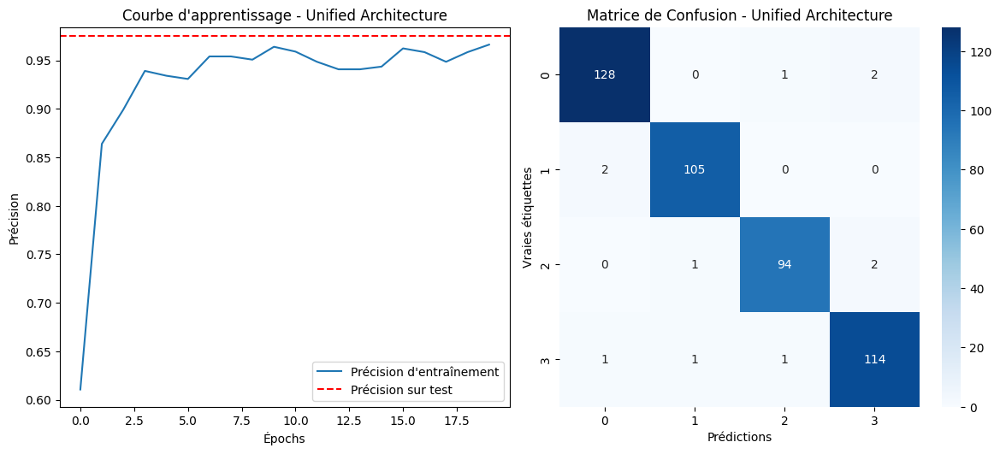

In [104]:
# Calcul de la précision sur l'ensemble de test
test_accuracy = accuracy_score(y_test, y_pred_classes)

# Tracer les courbes d'apprentissage et la matrice de confusion
plt.figure(figsize=(12, 10))

# Courbes d'apprentissage - Unified Architecture
plt.subplot(2, 2, 1)

# Courbe de précision d'entraînement
plt.plot(history['accuracy'], label='Précision d\'entraînement')

# Ajout de la précision sur l'ensemble de test
plt.axhline(y=test_accuracy, color='r', linestyle='--', label='Précision sur test')

# Titre et légendes
plt.title('Courbe d\'apprentissage - Unified Architecture')
plt.xlabel('Épochs')
plt.ylabel('Précision')
plt.legend()

# Matrice de confusion - Unified Architecture
plt.subplot(2, 2, 2)
sns.heatmap(conf_matrix_unified, annot=True, fmt="d", cmap="Blues",
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel('Prédictions')
plt.ylabel('Vraies étiquettes')
plt.title('Matrice de Confusion - Unified Architecture')

plt.tight_layout()
plt.show()

In [105]:
# Retrieve label encoder correspondancy
label_mapping = {i: class_name for i, class_name in enumerate(le.classes_)}
print("Label mapping:", label_mapping)

Label mapping: {0: np.str_('back'), 1: np.str_('forward'), 2: np.str_('halfsquat'), 3: np.str_('still')}


In [106]:
print("Accuracy: ", accuracy_score(y_test, y_pred_classes))
print("F1 score: ", f1_score(y_test, y_pred_classes, average="weighted"))
print(classification_report(y_test, y_pred_classes))

Accuracy:  0.9756637168141593
F1 score:  0.9756680094007646
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       131
           1       0.98      0.98      0.98       107
           2       0.98      0.97      0.97        97
           3       0.97      0.97      0.97       117

    accuracy                           0.98       452
   macro avg       0.98      0.98      0.98       452
weighted avg       0.98      0.98      0.98       452



##### Unified model (LOGO Repartition): GridSearch

In [112]:
# Convertir chaque matrice en float32 avant la concaténation
X0_train_logo = X0_train_logo.astype(np.float32)

In [113]:
X1_train_logo = X1_train_logo.astype(np.float32)

In [115]:
X2_train_logo = X2_train_logo.astype(np.float32)

In [116]:
X3_train_logo = X3_train_logo.astype(np.float32)

In [117]:
# Concatenate and convert directly to float32
X_train_combined_logo = np.concatenate([X0_train_logo, X1_train_logo, X2_train_logo, X3_train_logo], axis=-1)

# Print the shape for confirmation
print(f"X_train_combined_logo shape: {X_train_combined_logo.shape}")

X_train_combined_logo shape: (1971, 500, 830)


In [118]:
# Build model function for classifier argument 'build_fn'
def build_model_logo(learning_rate=0.001, dense_units_1=100, dense_units_2=50):
    input_data = Input(shape=(500, X_train_combined_logo.shape[2]), dtype='float32')
    x = layers.Dense(dense_units_1, activation='relu')(input_data)
    x = layers.Dense(dense_units_2, activation='relu')(x)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(len(np.unique(y_train_logo)), activation='softmax')(x)
    
    model = Model(inputs=input_data, outputs=x)
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  metrics=["accuracy"], 
                  loss="sparse_categorical_crossentropy")
    return model


In [119]:
# instanciate Build model logo function
model_unified_gs_logo = build_model_logo(learning_rate=0.001, dense_units_1=100, dense_units_2=50)

In [120]:
model_unified_gs_logo.summary()

Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_43 (InputLayer)     │ (None, 500, 830)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 500, 100)       │        83,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 500, 50)        │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_37     │ (None, 50)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 4)              │           204 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,354 (345.13 KB)

 Trainable params: 88,354 (345.13 KB)

 Non-trainable params: 0 (0.00 B)

In [121]:
# Check Input models
print(model_unified_gs_logo.input)

<KerasTensor shape=(None, 500, 830), dtype=float32, sparse=False, name=keras_tensor_185>


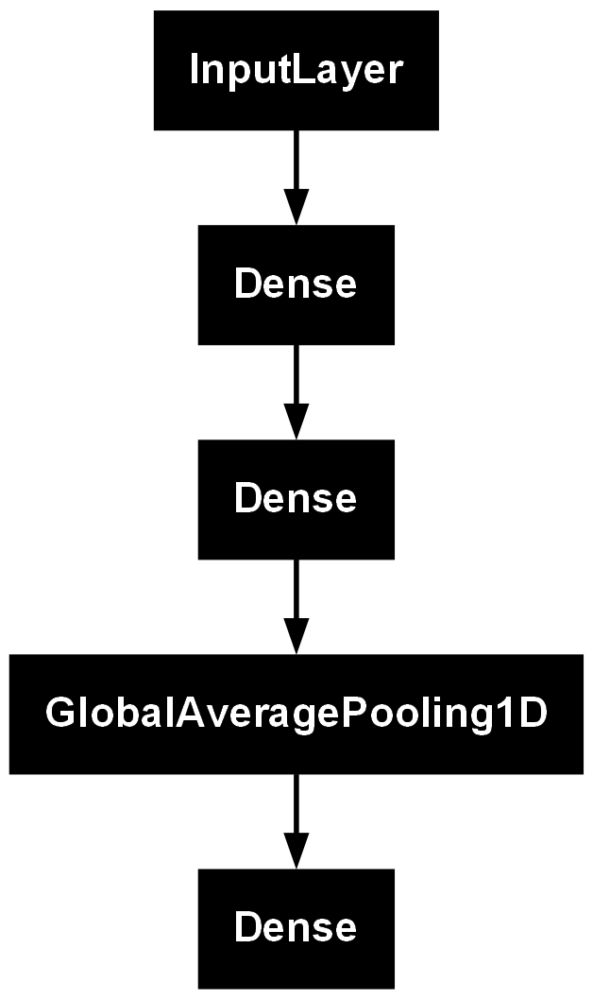

In [122]:
keras.utils.plot_model(model_unified_gs_logo)

In [123]:
print(f"Forme de X0_train : {X0_train_logo.shape}")
print(f"Forme de X1_train : {X1_train_logo.shape}")  
print(f"Forme de X2_train : {X2_train_logo.shape}")
print(f"Forme de X2_train : {X3_train_logo.shape}")
print(f"Forme de y_train : {y_train_logo.shape}")

Forme de X0_train : (1971, 500, 16)
Forme de X1_train : (1971, 500, 54)
Forme de X2_train : (1971, 500, 682)
Forme de X2_train : (1971, 500, 78)
Forme de y_train : (1971,)


In [124]:
print(f"X_train_combined shape: {X_train_combined_logo.shape}")
print(f"y_train shape: {y_train_logo.shape}")

X_train_combined shape: (1971, 500, 830)
y_train shape: (1971,)


In [ ]:
# Convert to float32 to optimize RAM memory
X0_test_logo = X0_test_logo.astype(np.float32)

In [127]:
X1_test_logo = X1_test_logo.astype(np.float32)

In [128]:
X2_test_logo = X2_test_logo.astype(np.float32)

In [129]:
X3_test_logo = X3_test_logo.astype(np.float32)

In [137]:
y_test_logo = y_test_logo.astype(np.int32)
y_train_logo = y_train_logo.astype(np.int32)

In [138]:
X_test_combined_logo = np.concatenate([X0_test_logo, X1_test_logo, X2_test_logo, X3_test_logo], axis=-1)

print(f"X_tes_combined shape: {X_test_combined_logo.shape}")
print(f"y_test shape: {y_test_logo.shape}")

X_tes_combined shape: (289, 500, 830)
y_test shape: (289,)


In [139]:
param_grid = {
    'learning_rate': [0.001, 0.01],
    'dense_units_1': [100, 200],
    'dense_units_2': [50, 100],
    'batch_size': [32],
    'epochs': [10, 20]
}

In [ ]:
classifier_logo = KerasClassifier(
    build_fn=build_model_logo,   # Fonction pour construire le modèle
    learning_rate=0.001,    # Paramètres de build_model
    dense_units_1=100,      # Paramètres de build_model
    dense_units_2=50,       # Paramètres de build_model
    epochs=20,              # Paramètre propre au KerasClassifier
    batch_size=32,          # Paramètre propre au KerasClassifier
    verbose=1               # Paramètre propre au KerasClassifier
)

In [141]:
print(classifier_logo.get_params().keys())

dict_keys(['model', 'build_fn', 'warm_start', 'random_state', 'optimizer', 'loss', 'metrics', 'batch_size', 'validation_batch_size', 'verbose', 'callbacks', 'validation_split', 'shuffle', 'run_eagerly', 'epochs', 'learning_rate', 'dense_units_1', 'dense_units_2', 'class_weight'])


In [144]:
# Perform gridsearch logo
grid_logo = GridSearchCV(estimator=classifier_logo, param_grid=param_grid, cv=3, n_jobs = 1)

In [145]:
# Train model with gridsearch
grid_result_logo = grid_logo.fit(X_train_combined_logo, y_train_logo)

print(f"Best Score: {grid_result_logo.best_score_}")
print(f"Best Params: {grid_result_logo.best_params_}")

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - accuracy: 0.5293 - loss: 2.3909
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.8906 - loss: 0.2979
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.9552 - loss: 0.1508
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9619 - loss: 0.1196
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9478 - loss: 0.1436
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9698 - loss: 0.0893
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9687 - loss: 0.0908
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9652 - loss: 0.0841
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9696 - loss: 0.0726
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9721 - loss: 0.1062
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.4731 - loss: 5.5372
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8922 - loss: 0.3846
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9134 - loss: 0.4840
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9081 - loss: 0.5769
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9550 - loss: 0.3418
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9100 - loss: 0.7656
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9416 - loss: 0.3129
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9564 - loss: 0.2303
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9485 - loss: 0.3280
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9653 - loss: 0.1127
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.5157 - loss: 4.9114
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.8772 - loss: 1.0309
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9352 - loss: 0.2419
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9581 - loss: 0.2043
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9527 - loss: 0.2661
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9665 - loss: 0.1257
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9563 - loss: 0.2408
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9596 - loss: 0.2664
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9610 - loss: 0.1744
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9557 - loss: 0.1974
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.4664 - loss: 8.7908
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8503 - loss: 0.4203
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8424 - loss: 0.3953
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9425 - loss: 0.1387
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9347 - loss: 0.1719
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9516 - loss: 0.1290
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9629 - loss: 0.0874
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9600 - loss: 0.0885
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9587 - loss: 0.1135
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9836 - loss: 0.0487
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.3933 - loss: 10.3477
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7674 - loss: 0.7912
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8909 - loss: 0.4586
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8781 - loss: 0.3188
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8811 - loss: 0.3182
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.9286 - loss: 0.1791
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9608 - loss: 0.1492
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9431 - loss: 0.1612
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9388 - loss: 0.1799
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9347 - loss: 0.1679
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.4760 - loss: 10.6302
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8373 - loss: 0.5896
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9240 - loss: 0.2148
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8376 - loss: 0.5156
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9415 - loss: 0.1517
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8881 - loss: 0.2927
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9257 - loss: 0.2530
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9671 - loss: 0.0873
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9774 - loss: 0.0709
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9690 - loss: 0.0936
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.5951 - loss: 1.8652
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9175 - loss: 0.2518
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9597 - loss: 0.1170
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9430 - loss: 0.1453
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9667 - loss: 0.0823
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9681 - loss: 0.0933
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9064 - loss: 0.3187
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9606 - loss: 0.0941
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9755 - loss: 0.0591
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9601 - loss: 0.1014
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9598 - loss: 0.0828
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.5082 - loss: 5.9939
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8986 - loss: 0.6197
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9237 - loss: 0.6142
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9558 - loss: 0.1417
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9592 - loss: 0.2049
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9569 - loss: 0.2526
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9598 - loss: 0.1543
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9500 - loss: 0.2367
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9662 - loss: 0.1114
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9759 - loss: 0.0794
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9713 - loss: 0.1521
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.4472 - loss: 4.6295
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9000 - loss: 0.4255
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9632 - loss: 0.1384
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9486 - loss: 0.3262
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9682 - loss: 0.1200
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9649 - loss: 0.1647
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9398 - loss: 0.3740
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9579 - loss: 0.1543
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9675 - loss: 0.0889
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9732 - loss: 0.0686
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9778 - loss: 0.1200
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.5295 - loss: 4.4585
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8407 - loss: 0.4339
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9029 - loss: 0.2268
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9257 - loss: 0.1895
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9211 - loss: 0.2085
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9543 - loss: 0.1086
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9524 - loss: 0.1277
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9533 - loss: 0.1192
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9654 - loss: 0.0816
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9615 - loss: 0.0986
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9754 - loss: 0.0607
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.4130 - loss: 10.3530
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.7423 - loss: 0.6450
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8778 - loss: 0.3171
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8692 - loss: 0.3325
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9574 - loss: 0.1339
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9585 - loss: 0.1034
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9522 - loss: 0.1797
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9274 - loss: 0.2479
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9622 - loss: 0.1134
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9690 - loss: 0.0938
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9439 - loss: 0.1488
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.4966 - loss: 12.6747
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8302 - loss: 0.4368
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9334 - loss: 0.1709
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9366 - loss: 0.1498
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9519 - loss: 0.1173
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9407 - loss: 0.1540
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9505 - loss: 0.1170
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9564 - loss: 0.1270
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9576 - loss: 0.1023
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9707 - loss: 0.0680
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9841 - loss: 0.0518
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.5525 - loss: 1.9712
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9472 - loss: 0.1963
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9553 - loss: 0.1232
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9649 - loss: 0.0943
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9640 - loss: 0.0981
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9643 - loss: 0.0871
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9595 - loss: 0.1136
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9702 - loss: 0.0786
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9764 - loss: 0.0743
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9512 - loss: 0.1090
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.5980 - loss: 3.6351
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9071 - loss: 0.3254
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9335 - loss: 0.9905
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9246 - loss: 0.3887
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9287 - loss: 0.8984
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9295 - loss: 0.5125
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9100 - loss: 0.3919
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9697 - loss: 0.1415
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9660 - loss: 0.2274
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9483 - loss: 0.4407
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.5583 - loss: 2.5993
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9117 - loss: 0.3713
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9342 - loss: 0.3396
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9601 - loss: 0.2352
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9390 - loss: 0.1747
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9636 - loss: 0.1581
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8665 - loss: 2.4215
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9237 - loss: 0.7037
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9701 - loss: 0.0775
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9820 - loss: 0.0563
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.4556 - loss: 5.7101
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8320 - loss: 0.4137
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9087 - loss: 0.2271
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9420 - loss: 0.1445
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9499 - loss: 0.1539
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9540 - loss: 0.1290
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9719 - loss: 0.0781
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9624 - loss: 0.0997
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9562 - loss: 0.1195
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9554 - loss: 0.1138
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.5443 - loss: 8.5569
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8056 - loss: 0.6143
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8202 - loss: 0.5008
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9241 - loss: 0.2230
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9405 - loss: 0.1544
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8858 - loss: 0.5517
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9454 - loss: 0.1529
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9556 - loss: 0.1201
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9561 - loss: 0.1448
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9641 - loss: 0.0884
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.4541 - loss: 10.0452
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8146 - loss: 0.5658
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9013 - loss: 0.3059
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9375 - loss: 0.2386
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9569 - loss: 0.1270
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9604 - loss: 0.1604
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9596 - loss: 0.1128
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9550 - loss: 0.1751
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9535 - loss: 0.1315
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9291 - loss: 0.2097
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.5055 - loss: 2.7690
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9201 - loss: 0.2337
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9514 - loss: 0.1450
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9522 - loss: 0.1154
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9262 - loss: 0.1804
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9655 - loss: 0.0785
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9677 - loss: 0.0910
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9075 - loss: 0.3311
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9701 - loss: 0.0915
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9742 - loss: 0.0605
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9769 - loss: 0.0555
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.5737 - loss: 4.1761
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8933 - loss: 0.3902
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9083 - loss: 0.5504
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9399 - loss: 0.2976
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9313 - loss: 0.3958
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9600 - loss: 0.1795
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9182 - loss: 0.6328
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9392 - loss: 0.2745
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8905 - loss: 4.0435
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9504 - loss: 0.2717
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9559 - loss: 0.2171
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.5424 - loss: 3.1164
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.9146 - loss: 0.5010
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.9673 - loss: 0.2682
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9505 - loss: 0.3411
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9615 - loss: 0.1514
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8776 - loss: 0.5589
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9724 - loss: 0.0785
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9587 - loss: 0.3983
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9514 - loss: 0.2346
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9689 - loss: 0.1055
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9614 - loss: 0.1808
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.4147 - loss: 9.6647 
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8173 - loss: 0.4065
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9104 - loss: 0.2395
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9375 - loss: 0.1844
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8758 - loss: 0.3683
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9487 - loss: 0.1189
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9153 - loss: 0.2733
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8845 - loss: 0.3989
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8801 - loss: 0.3765
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9322 - loss: 0.1565
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9592 - loss: 0.0850
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.4568 - loss: 9.0054
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8034 - loss: 0.5110
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8948 - loss: 0.2655
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9200 - loss: 0.2026
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9484 - loss: 0.2080
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9404 - loss: 0.1610
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9327 - loss: 0.3900
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9257 - loss: 0.2188
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9474 - loss: 0.1246
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9350 - loss: 0.1922
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9561 - loss: 0.1211
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.4426 - loss: 14.1620
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.7908 - loss: 0.5975
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9267 - loss: 0.2206
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9301 - loss: 0.1735
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9416 - loss: 0.1783
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9456 - loss: 0.1383
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9463 - loss: 0.1377
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9189 - loss: 0.2702
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9583 - loss: 0.1099
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9621 - loss: 0.1001
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9754 - loss: 0.0635
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.5892 - loss: 2.2530
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8881 - loss: 0.2857
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9559 - loss: 0.1311
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9717 - loss: 0.0828
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9579 - loss: 0.1001
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9677 - loss: 0.0966
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9533 - loss: 0.1335
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9537 - loss: 0.1118
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9720 - loss: 0.0831
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9774 - loss: 0.0667
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.5771 - loss: 3.6836
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8410 - loss: 1.7653
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8895 - loss: 1.2141
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9515 - loss: 0.1753
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9503 - loss: 0.1930
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9551 - loss: 0.2851
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9614 - loss: 0.2942
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9742 - loss: 0.1267
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9612 - loss: 0.4036
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9584 - loss: 0.1775
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.5643 - loss: 5.2045
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8933 - loss: 0.8900
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9320 - loss: 0.3469
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9606 - loss: 0.1262
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.8958 - loss: 2.1821
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9686 - loss: 0.1479
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9671 - loss: 0.1192
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9732 - loss: 0.1284
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9772 - loss: 0.0744
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9672 - loss: 0.1621
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.4522 - loss: 10.1476
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.7425 - loss: 0.6203
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8781 - loss: 0.3385
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9141 - loss: 0.2594
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9249 - loss: 0.1891
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9608 - loss: 0.1071
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9572 - loss: 0.1183
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9031 - loss: 0.3313
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9476 - loss: 0.1292
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9741 - loss: 0.0634
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.4561 - loss: 22.0912
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.6834 - loss: 0.7467
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.7950 - loss: 0.4886
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8733 - loss: 0.3254
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.8494 - loss: 0.3537
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8863 - loss: 0.2966
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9282 - loss: 0.1694
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9133 - loss: 0.1908
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9215 - loss: 0.1747
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9285 - loss: 0.1732
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.3971 - loss: 23.5103
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.6067 - loss: 0.8764
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6627 - loss: 0.7636
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7030 - loss: 0.6826
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7111 - loss: 0.6408
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8031 - loss: 0.5852
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.8072 - loss: 0.5832
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.8474 - loss: 0.5078
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.8866 - loss: 0.3771
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.6950 - loss: 0.7015
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.6385 - loss: 1.7157
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9482 - loss: 0.1675
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9512 - loss: 0.1467
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9643 - loss: 0.1020
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9240 - loss: 0.2960
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9642 - loss: 0.0886
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9359 - loss: 0.1848
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9674 - loss: 0.0939
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9604 - loss: 0.1141
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9618 - loss: 0.0889
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9512 - loss: 0.1561
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.5544 - loss: 4.0773
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9110 - loss: 0.4284
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9153 - loss: 0.4233
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9125 - loss: 0.6495
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9447 - loss: 0.3258
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9388 - loss: 0.3138
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9505 - loss: 0.1521
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9642 - loss: 0.1149
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9827 - loss: 0.1076
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9733 - loss: 0.0874
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9707 - loss: 0.1755
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.5874 - loss: 5.2301
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.8957 - loss: 2.2197
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9081 - loss: 0.5554
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9290 - loss: 0.2169
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9632 - loss: 0.1631
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9736 - loss: 0.0889
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9735 - loss: 0.0865
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9605 - loss: 0.1464
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9565 - loss: 0.1973
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9617 - loss: 0.1715
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9611 - loss: 0.2000
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.4390 - loss: 11.0974
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.7536 - loss: 0.6192
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8835 - loss: 0.3014
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8724 - loss: 0.3501
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9284 - loss: 0.1695
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9494 - loss: 0.1405
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9404 - loss: 0.1616
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9277 - loss: 0.1502
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9095 - loss: 0.2042
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9588 - loss: 0.1030
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9430 - loss: 0.1649
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.4013 - loss: 14.7453
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.6426 - loss: 0.9151
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.6435 - loss: 0.7863
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6562 - loss: 0.7323
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6713 - loss: 0.6769
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6825 - loss: 0.6400
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6883 - loss: 0.6526
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.7102 - loss: 0.6086
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.7014 - loss: 0.6448
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7074 - loss: 0.5668
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.7320 - loss: 0.5284
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.3751 - loss: 23.7830
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.4874 - loss: 0.9840
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6250 - loss: 0.8739
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6306 - loss: 0.8341
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.6434 - loss: 0.8227
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.6478 - loss: 0.7544
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6419 - loss: 0.7426
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6480 - loss: 0.7610
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.6418 - loss: 0.7277
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.6719 - loss: 0.7022
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7015 - loss: 0.7007
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.5880 - loss: 2.1594
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9386 - loss: 0.1861
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9517 - loss: 0.1321
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9679 - loss: 0.0923
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8929 - loss: 0.4991
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9461 - loss: 0.1180
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9290 - loss: 0.2726
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9756 - loss: 0.0761
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9665 - loss: 0.0919
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9774 - loss: 0.0494
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.5279 - loss: 5.9389
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.8575 - loss: 2.1175
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.8725 - loss: 0.7852
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9654 - loss: 0.2262
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9405 - loss: 0.3694
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9651 - loss: 0.1271
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9659 - loss: 0.3167
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9524 - loss: 0.2144
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9534 - loss: 0.1686
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9619 - loss: 0.4520
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.5737 - loss: 5.6206
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8950 - loss: 0.5474
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9471 - loss: 0.2181
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9456 - loss: 0.3584
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9018 - loss: 2.5636
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9463 - loss: 0.1958
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9607 - loss: 0.0985
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9700 - loss: 0.0816
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9567 - loss: 0.1668
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9718 - loss: 0.1884
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.4513 - loss: 11.2196
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.8415 - loss: 0.4471
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.9022 - loss: 0.2481
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - accuracy: 0.9052 - loss: 0.2544
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.9437 - loss: 0.1569
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.8710 - loss: 0.3922
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9616 - loss: 0.1159
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9719 - loss: 0.0777
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9604 - loss: 0.1082
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9706 - loss: 0.0793
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.3507 - loss: 25.0680
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.7404 - loss: 0.6459
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8844 - loss: 0.3025
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9183 - loss: 0.2840
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8741 - loss: 0.3500
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9302 - loss: 0.1682
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9483 - loss: 0.2948
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9234 - loss: 0.3248
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9553 - loss: 0.1624
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9273 - loss: 0.2380
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.4790 - loss: 16.0223
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8114 - loss: 0.5024
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8832 - loss: 0.3143
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9241 - loss: 0.2482
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9653 - loss: 0.0912
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8970 - loss: 0.3158
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - accuracy: 0.9492 - loss: 0.1128
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.9175 - loss: 0.2812
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9649 - loss: 0.0797
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.9141 - loss: 0.3751
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.5390 - loss: 2.8840
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9349 - loss: 0.1999
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9697 - loss: 0.0928
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9720 - loss: 0.0839
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9666 - loss: 0.0905
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9602 - loss: 0.0987
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9777 - loss: 0.0692
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9593 - loss: 0.1070
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9274 - loss: 0.1629
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9211 - loss: 0.2645
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9677 - loss: 0.0946
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.5845 - loss: 5.1378
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.8888 - loss: 0.7989
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8572 - loss: 0.6424
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9370 - loss: 0.2292
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9480 - loss: 0.2686
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9439 - loss: 0.4510
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9561 - loss: 0.1816
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9643 - loss: 0.1117
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9757 - loss: 0.1092
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9552 - loss: 0.3371
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9496 - loss: 0.3324
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.6115 - loss: 4.3530
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8825 - loss: 1.1389
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9416 - loss: 0.6035
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9529 - loss: 0.2489
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9656 - loss: 0.1716
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9800 - loss: 0.1096
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9611 - loss: 0.1370
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9644 - loss: 0.1265
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9309 - loss: 0.3769
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9619 - loss: 0.1114
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9764 - loss: 0.1460
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy:

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.4992 - loss: 12.8188
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.6972 - loss: 0.7120
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8782 - loss: 0.2924
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8935 - loss: 0.2785
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.8918 - loss: 0.2972
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9492 - loss: 0.1288
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9659 - loss: 0.0956
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9675 - loss: 0.0982
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9803 - loss: 0.0588
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9725 - loss: 0.0639
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8854 - loss: 0.3608
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.3544 - loss: 20.1169
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.6828 - loss: 0.7251
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8161 - loss: 0.4490
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.7859 - loss: 0.5726
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.8624 - loss: 0.3501
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9051 - loss: 0.2473
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9234 - loss: 0.2094
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8435 - loss: 0.4550
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9204 - loss: 0.1875
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9130 - loss: 0.1787
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9094 - loss: 0.2181
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.5036 - loss: 19.0209
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.8141 - loss: 0.7444
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9334 - loss: 0.1943
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9128 - loss: 0.2369
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9711 - loss: 0.0916
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.8982 - loss: 0.3696
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9471 - loss: 0.1231
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9722 - loss: 0.0827
Epoch 9/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9780 - loss: 0.0592
Epoch 10/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - accuracy: 0.9661 - loss: 0.0774
Epoch 11/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.9737 - loss: 0.0778
Epoch 12/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.4310 - loss: 14.0127
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.8256 - loss: 0.4939
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.8600 - loss: 0.3660
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8994 - loss: 0.2463
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.8915 - loss: 0.2553
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9293 - loss: 0.2022
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9193 - loss: 0.1954
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9282 - loss: 0.1572
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9478 - loss: 0.1290
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9381 - loss: 0.1476
Best Score: 0.6915271435819381
Best Params: {'batch_size': 32, 'dense_units_1': 200, 'dense_units_2': 100, 'epochs': 10, 'learning_rate': 0.01}


In [146]:
# Evaluate model with best hyperparameters 
test_accuracy_logo = grid_result_logo.best_estimator_.score(X_test_combined_logo, y_test_logo)
print(f"Précision sur le jeu de test : {test_accuracy_logo}")

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Précision sur le jeu de test : 0.5986159169550173


In [147]:
best_params_logo = grid_result_logo.best_params_

print(f"Meilleurs paramètres trouvés : {best_params_logo}")

Meilleurs paramètres trouvés : {'batch_size': 32, 'dense_units_1': 200, 'dense_units_2': 100, 'epochs': 10, 'learning_rate': 0.01}


In [148]:
# Mettre à jour les hyperparamètres du classifieur avec les meilleurs paramètres trouvés
classifier_logo.set_params(
    dense_units_1=best_params_logo['dense_units_1'],
    dense_units_2=best_params_logo['dense_units_2'],
    learning_rate=best_params_logo['learning_rate'],
    batch_size=best_params_logo['batch_size'],
    epochs=best_params_logo['epochs']
)

KerasClassifier(
	model=None
	build_fn=<function build_model_logo at 0x000002A4E13A2680>
	warm_start=False
	random_state=None
	optimizer=rmsprop
	loss=None
	metrics=None
	batch_size=32
	validation_batch_size=None
	verbose=1
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=10
	learning_rate=0.01
	dense_units_1=200
	dense_units_2=100
	class_weight=None
)

In [149]:
# Réentraîner le modèle avec les meilleurs hyperparamètres
history_unified_gs_logo = classifier_logo.fit(X_train_combined_logo, y_train_logo)

c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - accuracy: 0.4549 - loss: 12.7405
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7920 - loss: 0.5047
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.8766 - loss: 0.2999
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.9283 - loss: 0.1943
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.9389 - loss: 0.1686
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.9367 - loss: 0.1723
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.9548 - loss: 0.1216
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9561 - loss: 0.1269
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.9223 - loss: 0.2279
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.9411 - loss: 0.1703


In [150]:
# Prédictions sur l'ensemble de test
y_pred_classes_logo = classifier_logo.predict(X_test_combined_logo)#.argmax(axis=1)

# Matrice de confusion
conf_matrix_unified_gs_logo = confusion_matrix(y_test_logo, y_pred_classes_logo)

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


In [151]:
# Accès à l'historique with keras classifier
history_gs_logo = classifier_logo.history_

# Affichage des clés disponibles dans l'historique
print(history_gs_logo.keys())

dict_keys(['accuracy', 'loss'])


In [ ]:
# Make predictions for model
# y_pred_unified = classifier.predict(X_test_combined)

# print(f"Type of y_pred_unified: {type(y_pred_unified)}")
# print(f"Shape of y_pred_unified: {np.shape(y_pred_unified)}")

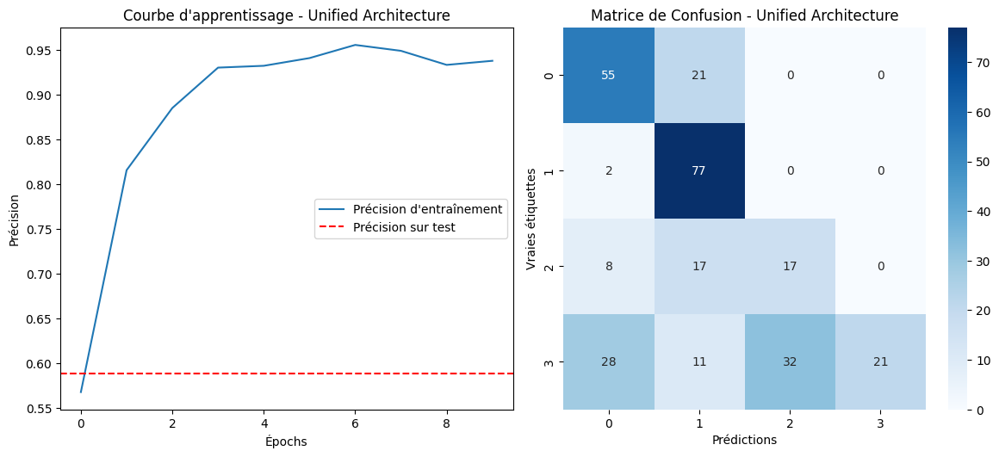

In [152]:
# Calcul de la précision sur l'ensemble de test
test_accuracy_gs_logo = accuracy_score(y_test_logo, y_pred_classes_logo)

# Tracer les courbes d'apprentissage et la matrice de confusion
plt.figure(figsize=(12, 10))

# Courbes d'apprentissage - Unified Architecture
plt.subplot(2, 2, 1)

# Courbe de précision d'entraînement
plt.plot(history_gs_logo['accuracy'], label='Précision d\'entraînement')

# Ajout de la précision sur l'ensemble de test
plt.axhline(y=test_accuracy_gs_logo, color='r', linestyle='--', label='Précision sur test')

# Titre et légendes
plt.title('Courbe d\'apprentissage - Unified Architecture')
plt.xlabel('Épochs')
plt.ylabel('Précision')
plt.legend()

# Matrice de confusion - Unified Architecture
plt.subplot(2, 2, 2)
sns.heatmap(conf_matrix_unified_gs_logo, annot=True, fmt="d", cmap="Blues",
            xticklabels=np.unique(y_test_logo), yticklabels=np.unique(y_test_logo))
plt.xlabel('Prédictions')
plt.ylabel('Vraies étiquettes')
plt.title('Matrice de Confusion - Unified Architecture')

plt.tight_layout()
plt.show()

In [153]:
# Retrieve label encoder correspondancy
label_mapping = {i: class_name for i, class_name in enumerate(le.classes_)}
print("Label mapping:", label_mapping)

Label mapping: {0: np.str_('back'), 1: np.str_('forward'), 2: np.str_('halfsquat'), 3: np.str_('still')}


In [ ]:
# Display some metrics
print("Accuracy: ", accuracy_score(y_test_logo, y_pred_classes_logo))
print("F1 score: ", f1_score(y_test_logo, y_pred_classes_logo, average="weighted"))
print(classification_report(y_test_logo, y_pred_classes_logo))

Accuracy:  0.5882352941176471
F1 score:  0.549137699109034
              precision    recall  f1-score   support

           0       0.59      0.72      0.65        76
           1       0.61      0.97      0.75        79
           2       0.35      0.40      0.37        42
           3       1.00      0.23      0.37        92

    accuracy                           0.59       289
   macro avg       0.64      0.58      0.54       289
weighted avg       0.69      0.59      0.55       289



#### Multimodal model (standard Repartition) : RandomSearch

In [ ]:
def build_multimodal_model(hp):
    # Hyperparameters
    dense_units = hp.Choice('dense_units', [32, 64, 128])
    learning_rate = hp.Float('learning_rate', min_value=0.0001, max_value=0.01, sampling='LOG')

    # Inputs for each modalities
    input_ips = Input(shape=(X0_train.shape[1], X0_train.shape[2]), name = 'input_layer', dtype='float32')
    x_ips = layers.Dense(dense_units, activation="relu")(input_ips)
    x_ips = layers.GlobalAveragePooling1D()(x_ips)

    input_emg = Input(shape=(X1_train.shape[1], X1_train.shape[2]), name = 'input_layer_1', dtype='float32')
    x_emg = layers.Dense(dense_units, activation="relu")(input_emg)
    x_emg = layers.GlobalAveragePooling1D()(x_emg)

    input_imu = Input(shape=(X2_train.shape[1], X2_train.shape[2]), name = 'input_layer_2', dtype='float32')
    x_imu = layers.Dense(dense_units, activation="relu")(input_imu)
    x_imu = layers.GlobalAveragePooling1D()(x_imu)

    input_mocap = Input(shape=(X3_train.shape[1], X3_train.shape[2]), name = 'input_layer_3', dtype='float32')
    x_mocap = layers.Dense(dense_units, activation="relu")(input_mocap)
    x_mocap = layers.GlobalAveragePooling1D()(x_mocap)

    # Merged modalities
    x_concat = layers.concatenate([x_ips, x_emg, x_imu, x_mocap], axis=-1)

    # final layers
    x = layers.Dense(100, activation='relu')(x_concat)
    x = layers.Dense(50, activation='relu')(x)
    output = layers.Dense(len(np.unique(y_train)), activation='softmax')(x)

    # Model
    model = Model(inputs=[input_ips, input_emg, input_imu, input_mocap], outputs=output)
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model

By default, `KerasClassifier` expects a single input (a 2D matrix `X`), which creates issues for models with multiple inputs (such as a multimodal model).

In [ ]:
# Instanciate Keras Tuner
tuner = kt.RandomSearch(
    build_multimodal_model,
    objective='val_accuracy',  # Objectif à optimiser
    max_trials=10,             # Nombre maximal d'essais
    executions_per_trial=1,    # Exécutions par essai
    directory='tuner_results', 
    project_name='multimodal_tuning'
)

Reloading Tuner from tuner_results\multimodal_tuning\tuner0.json


In [ ]:
# Build the model with the best hyperparameters
X_train_combined = {
    "input_layer": X0_train,
    "input_layer_1": X1_train,
    "input_layer_2": X2_train,
    "input_layer_3": X3_train
}

In [ ]:
# perform random search
tuner.search(
    X_train_combined, 
    y_train,
    batch_size=64,
    epochs=20,
    validation_split=0.2
)

In [ ]:
# Best hyperparameters found
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
# Display ptimized hyperparameters
print("Best Hyperparameters:")
print(f" - Dense Units: {best_hps.get('dense_units')}")
print(f" - Learning Rate: {best_hps.get('learning_rate')}")

Best Hyperparameters:
 - Dense Units: 128
 - Learning Rate: 0.0003121405045836608


In [ ]:
# Build the model with the best hyperparameters
best_model = tuner.hypermodel.build(best_hps)

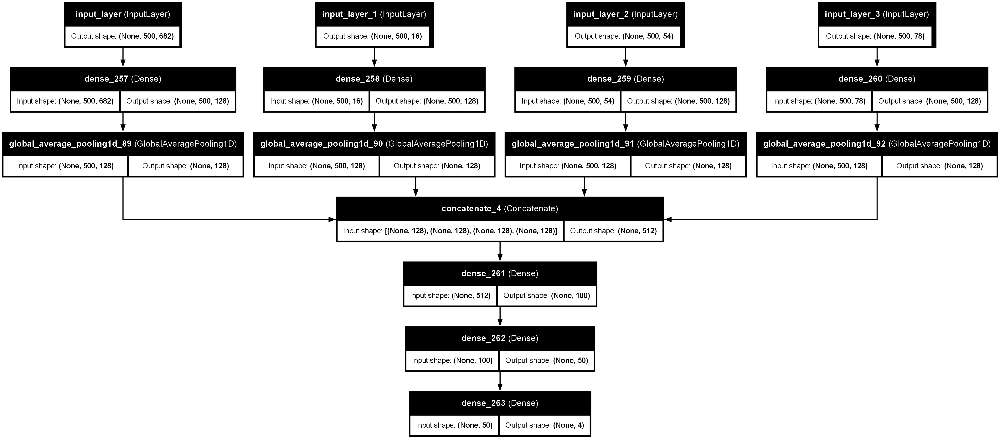

In [164]:
# Visualiser l'architecture du modèle
plot_model(best_model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

# Afficher l'image générée
Image(filename='model_architecture.png')

In [165]:
best_model.summary()

Model: "functional_83"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 500, 682)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 500, 16)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 500, 54)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 500, 78)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_257 (Dense)   │ (None, 500, 128)  │     87,424 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_258 (Dense)   │ (None, 500, 128)  │      2,176 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_259 (Dense)   │ (None, 500, 128)  │      7,040 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_260 (Dense)   │ (None, 500, 128)  │     10,112 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ dense_257[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ dense_258[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ dense_259[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ dense_260[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 512)       │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_261 (Dense)   │ (None, 100)       │     51,300 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_262 (Dense)   │ (None, 50)        │      5,050 │ dense_261[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_263 (Dense)   │ (None, 4)         │        204 │ dense_262[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 163,306 (637.91 KB)

 Trainable params: 163,306 (637.91 KB)

 Non-trainable params: 0 (0.00 B)

In [166]:
print(best_model.input)

[<KerasTensor shape=(None, 500, 682), dtype=float32, sparse=False, name=input_layer>, <KerasTensor shape=(None, 500, 16), dtype=float32, sparse=False, name=input_layer_1>, <KerasTensor shape=(None, 500, 54), dtype=float32, sparse=False, name=input_layer_2>, <KerasTensor shape=(None, 500, 78), dtype=float32, sparse=False, name=input_layer_3>]


In [ ]:
# Train on all training data
history = best_model.fit(
    X_train_combined, y_train,
    batch_size = 64,
    epochs = 20,
    validation_split=0.2,
    verbose=1
)

Epoch 1/20


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['input_layer', 'input_layer_1', 'input_layer_2', 'input_layer_3']. Received: the structure of inputs={'input_layer': '*', 'input_layer_1': '*', 'input_layer_2': '*', 'input_layer_3': '*'}
  warnings.warn(


23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 578ms/step - accuracy: 0.3155 - loss: 5.7920 - val_accuracy: 0.6436 - val_loss: 1.0252
Epoch 2/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.7054 - loss: 0.9270 - val_accuracy: 0.8370 - val_loss: 0.6120
Epoch 3/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - accuracy: 0.8392 - loss: 0.6022 - val_accuracy: 0.8895 - val_loss: 0.3323
Epoch 4/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.9164 - loss: 0.3147 - val_accuracy: 0.9227 - val_loss: 0.2729
Epoch 5/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.9473 - loss: 0.3085 - val_accuracy: 0.9475 - val_loss: 0.2496
Epoch 6/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.9537 - loss: 0.2268 - val_accuracy: 0.9448 - val_loss: 0.2241
Epoch 7/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.9628 - loss: 0.1656 - val_accuracy: 0.9503 - val_loss: 0.2731
Epoch 8/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.9549 - loss: 0.2703 - val_accuracy: 0.9420 - val_loss: 

In [ ]:
X_test_combined = {
    "input_layer": X0_test,
    "input_layer_1": X1_test,
    "input_layer_2": X2_test,
    "input_layer_3": X3_test
}

In [ ]:
# Evaluate model on test set
test_loss, test_accuracy = best_model.evaluate(X_test_combined, y_test)
print(f"Test Accuracy: {test_accuracy}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9738 - loss: 0.1153
Test Accuracy: 0.9601770043373108


In [ ]:
# Predictions on test set
y_pred = best_model.predict(X_test_combined)
y_pred_classes = np.argmax(y_pred, axis=1)

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


In [ ]:
# Define confusion matrix
conf_matrix_unified = confusion_matrix(y_test, y_pred_classes)

In [ ]:
# Access to history data
history_multimod = history.history

PLOT RESULTS

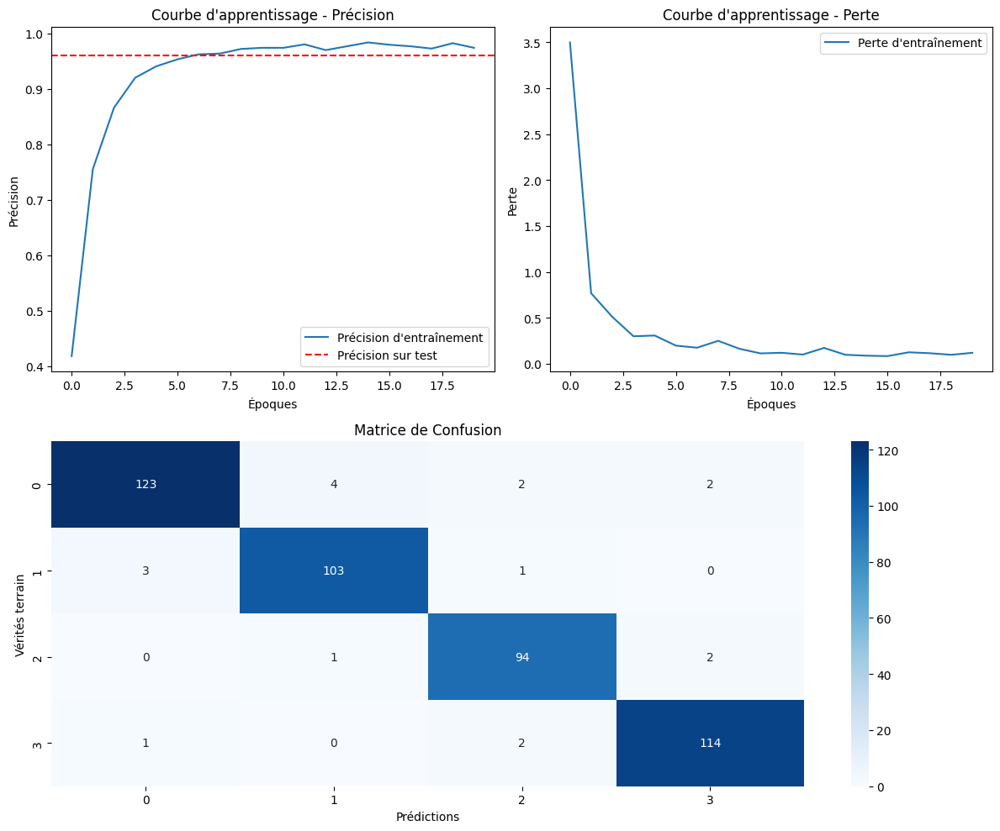

In [ ]:
# Define graph size
plt.figure(figsize=(12, 10))

# Training Accuracy Curve
plt.subplot(2, 2, 1)
plt.plot(history_multimod['accuracy'], label='accuracy on training set')
plt.axhline(y=test_accuracy, color='r', linestyle='--', label='Accuracy on test set')
plt.title('Learning Curve - Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot Training Loss Curve
plt.subplot(2, 2, 2)
plt.plot(history_multimod['loss'], label='Perte d\'entraînement')
plt.title('Learning Curve - Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Confusion MAtrice
plt.subplot(2, 2, (3, 4))
sns.heatmap(conf_matrix_unified, annot=True, fmt="d", cmap="Blues",
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel('Predictions')
plt.ylabel('True LAbels')
plt.title('Confusion MAtrix')

plt.tight_layout()
plt.show()

In [175]:
print("Accuracy: ", accuracy_score(y_test, y_pred_classes))
print("F1 score: ", f1_score(y_test, y_pred_classes, average="weighted"))
print(classification_report(y_test, y_pred_classes))

Accuracy:  0.9601769911504425
F1 score:  0.9601407453988852
              precision    recall  f1-score   support

           0       0.97      0.94      0.95       131
           1       0.95      0.96      0.96       107
           2       0.95      0.97      0.96        97
           3       0.97      0.97      0.97       117

    accuracy                           0.96       452
   macro avg       0.96      0.96      0.96       452
weighted avg       0.96      0.96      0.96       452



#### Multimodal model (LOGO Repartition) : RandomSearch

In [ ]:
# Define model functions
def build_multimodal_model_logo(hp):
    # Hyparameters to randomsearch with hp parameter
    dense_units = hp.Choice('dense_units', [32, 64, 128])
    learning_rate = hp.Float('learning_rate', min_value=0.0001, max_value=0.01, sampling='LOG')

    # Inputs for each modality with explicit names
    input_ips = Input(shape=(X0_train_logo.shape[1], X0_train_logo.shape[2]), name = 'input_layer', dtype='float32')
    x_ips = layers.Dense(dense_units, activation="relu")(input_ips)
    x_ips = layers.GlobalAveragePooling1D()(x_ips) # global average for reduce dimensionality

    input_emg = Input(shape=(X1_train_logo.shape[1], X1_train_logo.shape[2]), name = 'input_layer_1', dtype='float32')
    x_emg = layers.Dense(dense_units, activation="relu")(input_emg)
    x_emg = layers.GlobalAveragePooling1D()(x_emg)

    input_imu = Input(shape=(X2_train_logo.shape[1], X2_train_logo.shape[2]), name = 'input_layer_2', dtype='float32')
    x_imu = layers.Dense(dense_units, activation="relu")(input_imu)
    x_imu = layers.GlobalAveragePooling1D()(x_imu)

    input_mocap = Input(shape=(X3_train_logo.shape[1], X3_train_logo.shape[2]), name = 'input_layer_3', dtype='float32')
    x_mocap = layers.Dense(dense_units, activation="relu")(input_mocap)
    x_mocap = layers.GlobalAveragePooling1D()(x_mocap)

    # Merge modalities
    x_concat = layers.concatenate([x_ips, x_emg, x_imu, x_mocap], axis=-1)

    # Final layers
    x = layers.Dense(100, activation='relu')(x_concat)
    x = layers.Dense(50, activation='relu')(x)
    output = layers.Dense(len(np.unique(y_train_logo)), activation='softmax')(x)

    # Model
    model = Model(inputs=[input_ips, input_emg, input_imu, input_mocap], outputs=output)
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    
    return model

KerasClassifier by default expects a single input (a 2D matrix X), which creates an issue for models with multiple inputs, such as multimodal models. .to optimize the hyperparameters of the model while handling multiple inputs. Keras Tuner allows us to define a custom model-building function that supports multiple inputs, making it suitable for tuning multimodal architectures efficiently.

In [ ]:
# Instanciate Keras Tuner
tuner_logo = kt.RandomSearch(
    build_multimodal_model_logo,
    objective='val_accuracy',  # Objectif à optimiser
    max_trials=10,             # Nombre maximal d'essais
    executions_per_trial=1,    # Exécutions par essai
    directory='tuner_results', 
    project_name='multimodal_tuning'
)

Reloading Tuner from tuner_results\multimodal_tuning\tuner0.json


In [ ]:
# Prepare Multimodal Data as a Dictionary for random search
X_train_combined_rs_logo = {
    "input_layer": X0_train_logo,
    "input_layer_1": X1_train_logo,
    "input_layer_2": X2_train_logo,
    "input_layer_3": X3_train_logo
}

In [ ]:
# Launch random search : with 10 iter
tuner_logo.search(
    X_train_combined_rs_logo, 
    y_train_logo,
    batch_size=64,
    epochs=20,
    validation_split=0.2
)

In [ ]:
# Best hyperparameters found
best_hps_logo = tuner_logo.get_best_hyperparameters(num_trials=1)[0]
# Display optimized parameters
print("Best Hyperparameters:")
print(f" - Dense Units: {best_hps_logo.get('dense_units')}")
print(f" - Learning Rate: {best_hps_logo.get('learning_rate')}")

Best Hyperparameters:
 - Dense Units: 128
 - Learning Rate: 0.0003121405045836608


In [181]:
# Construire le modèle avec les meilleurs hyperparamètres
best_model_rs_logo = tuner_logo.hypermodel.build(best_hps_logo)

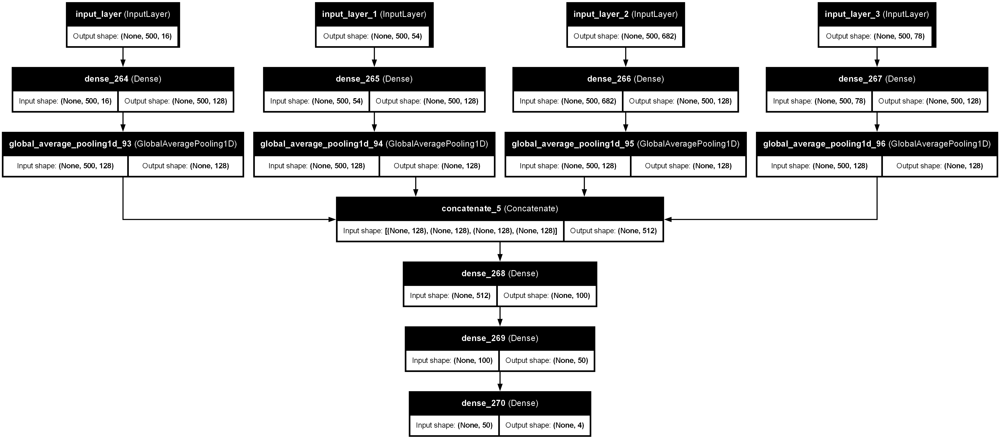

In [ ]:
from keras.utils import plot_model
from IPython.display import Image

# Define Model schema
plot_model(best_model_rs_logo, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

# Display model schema
Image(filename='model_architecture.png')

In [183]:
best_model_rs_logo.summary()

Model: "functional_84"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 500, 16)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 500, 54)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 500, 682)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 500, 78)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_264 (Dense)   │ (None, 500, 128)  │      2,176 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_265 (Dense)   │ (None, 500, 128)  │      7,040 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_266 (Dense)   │ (None, 500, 128)  │     87,424 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_267 (Dense)   │ (None, 500, 128)  │     10,112 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ dense_264[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ dense_265[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ dense_266[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ dense_267[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 512)       │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_268 (Dense)   │ (None, 100)       │     51,300 │ concatenate_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_269 (Dense)   │ (None, 50)        │      5,050 │ dense_268[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_270 (Dense)   │ (None, 4)         │        204 │ dense_269[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 163,306 (637.91 KB)

 Trainable params: 163,306 (637.91 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Check input model
print(best_model_rs_logo.input)

[<KerasTensor shape=(None, 500, 16), dtype=float32, sparse=False, name=input_layer>, <KerasTensor shape=(None, 500, 54), dtype=float32, sparse=False, name=input_layer_1>, <KerasTensor shape=(None, 500, 682), dtype=float32, sparse=False, name=input_layer_2>, <KerasTensor shape=(None, 500, 78), dtype=float32, sparse=False, name=input_layer_3>]


In [185]:
print(f"X_train_combined_rs_logo shape: {np.shape(X_train_combined_rs_logo)}")
print(f"y_train_logo shape: {np.shape(y_train_logo)}")


X_train_combined_rs_logo shape: ()
y_train_logo shape: (1971,)


In [ ]:
# Check shape
for key, value in X_train_combined_rs_logo.items():
    print(f"Key: {key}, Shape: {np.shape(value)}")


Key: input_layer, Shape: (1971, 500, 16)
Key: input_layer_1, Shape: (1971, 500, 54)
Key: input_layer_2, Shape: (1971, 500, 682)
Key: input_layer_3, Shape: (1971, 500, 78)


In [ ]:
# Train on All Training Data with best randomsearch parameters
history_rs_logo = best_model_rs_logo.fit(
    X_train_combined_rs_logo, y_train_logo,
    batch_size = 64,
    epochs = 20,
    validation_split=0.2,
    verbose=1
)

Epoch 1/20


c:\Users\Thibaut\Desktop\projetc_atc\venv\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['input_layer', 'input_layer_1', 'input_layer_2', 'input_layer_3']. Received: the structure of inputs={'input_layer': '*', 'input_layer_1': '*', 'input_layer_2': '*', 'input_layer_3': '*'}
  warnings.warn(


25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 273ms/step - accuracy: 0.4548 - loss: 3.5902 - val_accuracy: 0.4456 - val_loss: 1.1102
Epoch 2/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8517 - loss: 0.5641 - val_accuracy: 0.5468 - val_loss: 1.3100
Epoch 3/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.9382 - loss: 0.2706 - val_accuracy: 0.5544 - val_loss: 1.2389
Epoch 4/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.9662 - loss: 0.1529 - val_accuracy: 0.5595 - val_loss: 1.2962
Epoch 5/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.9695 - loss: 0.1289 - val_accuracy: 0.5975 - val_loss: 1.4444
Epoch 6/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.9701 - loss: 0.1686 - val_accuracy: 0.5797 - val_loss: 1.4079
Epoch 7/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.9676 - loss: 0.1975 - val_accuracy: 0.6278 - val_loss: 1.4922
Epoch 8/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.9630 - loss: 0.2282 - val_accuracy: 0.5772 - val_loss: 1

In [ ]:
# Define dict X_test combined
X_test_combined_logo = {
    "input_layer": X0_test_logo,
    "input_layer_1": X1_test_logo,
    "input_layer_2": X2_test_logo,
    "input_layer_3": X3_test_logo
}

In [ ]:
# Model Evaluatuion
test_loss_rs_logo, test_accuracy_rs_logo = best_model_rs_logo.evaluate(X_test_combined_logo, y_test_logo)
print(f"Test Accuracy: {test_accuracy_rs_logo}")

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5657 - loss: 3.3241
Test Accuracy: 0.5432525873184204


In [ ]:
# Predictions on test set
y_pred_rs_logo = best_model_rs_logo.predict(X_test_combined_logo)
y_pred_classes_rs_logo = np.argmax(y_pred_rs_logo, axis=1)

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


In [ ]:
# Define confusion matrix
conf_matrix_unified_rs_logo = confusion_matrix(y_test_logo, y_pred_classes_rs_logo)

In [196]:
# Access to history data
history_multimod_rs_logo = history_rs_logo.history

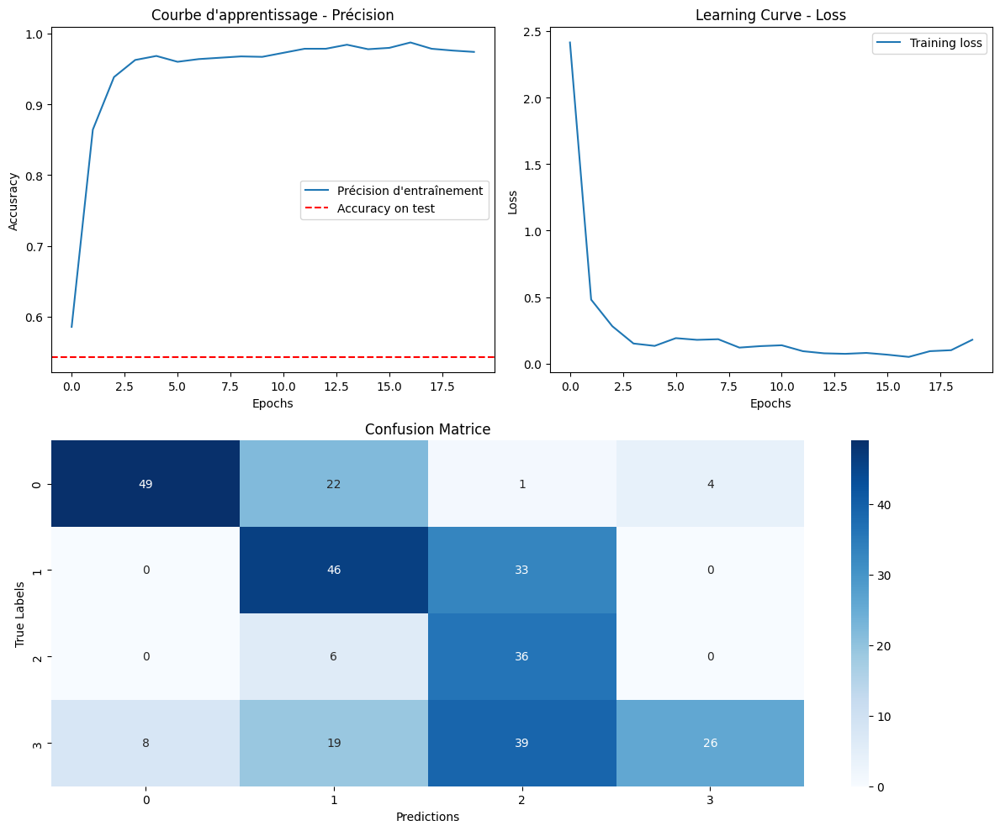

In [195]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define Graph size
plt.figure(figsize=(12, 10))

# Plot Training accuracy curve
plt.subplot(2, 2, 1)
plt.plot(history_multimod_rs_logo['accuracy'], label='Précision d\'entraînement')
plt.axhline(y=test_accuracy_rs_logo, color='r', linestyle='--', label='Accuracy on test')
plt.title('Courbe d\'apprentissage - Précision')
plt.xlabel('Epochs')
plt.ylabel('Accusracy')
plt.legend()

# Plot training loss curve
plt.subplot(2, 2, 2)
plt.plot(history_multimod_rs_logo['loss'], label='Training loss')
plt.title('Learning Curve - Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot confusion Matrice
plt.subplot(2, 2, (3, 4))
sns.heatmap(conf_matrix_unified_rs_logo, annot=True, fmt="d", cmap="Blues",
            xticklabels=np.unique(y_test_logo), yticklabels=np.unique(y_test_logo))
plt.xlabel('Predictions')
plt.ylabel('True Labels')
plt.title('Confusion Matrice')

plt.tight_layout()
plt.show()

In [ ]:
# Calculate metrics and classification report for model multimodal Lgo
print("Accuracy: ", accuracy_score(y_test_logo, y_pred_classes_rs_logo))
print("F1 score: ", f1_score(y_test_logo, y_pred_classes_rs_logo, average="weighted"))
print(classification_report(y_test_logo, y_pred_classes_rs_logo))

Accuracy:  0.5432525951557093
F1 score:  0.5449668469682072
              precision    recall  f1-score   support

           0       0.86      0.64      0.74        76
           1       0.49      0.58      0.53        79
           2       0.33      0.86      0.48        42
           3       0.87      0.28      0.43        92

    accuracy                           0.54       289
   macro avg       0.64      0.59      0.54       289
weighted avg       0.69      0.54      0.54       289



### Final Analysis and Conclusion

#### **Summary of Findings**
1. **Model Performance**:  
   - Models trained using **standard repartition** consistently outperformed those trained using **LOGO repartition**, achieving higher accuracy and F1 scores.  
   - The **optimized multimodal architecture** trained on standard repartition delivered the best results, demonstrating strong generalization within the dataset's distribution.  

2. **Challenges with LOGO Repartition**:  
   - Models trained with **LOGO repartition** struggled to generalize to unseen participant groups, indicating overfitting and poor adaptability to new data.  
   - A key issue arises from the imbalance in the data distribution for the last 5 participants used in the test set, which exacerbates the following challenges:  
     - **Bias in Model Evaluation**:  
       With fewer and less diverse data for the test participants, the model's performance metrics (e.g., accuracy, precision, recall, F1-score) may not accurately reflect its true capabilities.  
     - **Reduced Robustness in Generalization**:  
       Insufficient test data for specific participants limits the model's ability to generalize to unseen individuals, leading to uneven performance across different groups.  
     - **Increased Metric Variance**:  
       The limited test data increases variance in evaluation metrics, making results less stable and consistent across iterations.  
     - **Reduced Diversity of Movement Features**:  
       A smaller test set results in under-representation of unique participant characteristics, such as distinct movement styles or sensor variations, skewing the evaluation towards participants better represented in the training set.  
     - **Decreased Reliability of LOGO Testing**:  
       The LOGO approach relies on adequate test data for unseen participants. A lack of data undermines the statistical reliability of the evaluation, reducing the confidence in conclusions drawn from the LOGO-based experiments.  

3. **Multimodal Data Preprocessing**:  
   - Effective preprocessing is crucial for multimodal datasets to ensure synchronization, alignment, and normalization of sensor data. Improper preprocessing can significantly impact model performance.  

---

#### **Conclusion**  
The project highlights the complexity of working with multimodal datasets, particularly when aiming to generalize models for unseen groups. While both unified and multimodal architectures performed well under standard repartition, their inability to generalize under LOGO repartition suggests the need for improved preprocessing, model architecture, or training strategies. 

---

#### **Recommendations**
1. **Data Normalization**:  
   - Normalize sensor data, especially for **EMG** and **IMU**, to mitigate the impact of their wide value ranges on model performance.  

2. **Augmentation and Regularization**:  
   - Apply data augmentation and regularization techniques (e.g., dropout, weight decay) to reduce overfitting and improve generalization to unseen participants.  

3. **Address Data Imbalance in LOGO**:  
   - Ensure a more balanced data distribution across participants in the LOGO framework to enhance evaluation reliability.  

4. **Advanced Architectures**:  
   - Explore attention mechanisms, domain adaptation techniques, or meta-learning to improve adaptability to unseen groups.  

5. **Hyperparameter Optimization**:  
   - Continue leveraging optimization methods such as RandomSearch or GridSearch, focusing on LOGO repartition, to enhance model performance on unseen participants.  

6. **Diversify the Dataset**:  
   - Consider gathering additional data from underrepresented participants to capture more variations and improve generalization.  

---

At the end of this project, we think that this project underscores the importance of preprocessing, balanced repartition strategies, and targeted model optimization to unlock the full potential of multimodal datasets in real-world applications.